In [1]:
# Import necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.metrics import r2_score



pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Data Dictionary for reference 

Variables	Description
Prospect ID	- A unique ID with which the customer is identified.
Lead Number - 	A lead number assigned to each lead procured.
Lead Origin - The origin identifier with which the customer was identified to be a lead. Includes API, Landing Page Submission, etc.
Lead Source - The source of the lead. Includes Google, Organic Search, Olark Chat, etc.
Do Not Email- An indicator variable selected by the customer wherein they select whether of not they want to be emailed about the course or not.
Do Not Call - An indicator variable selected by the customer wherein they select whether of not they want to be called about the course or not.
Converted - The target variable. Indicates whether a lead has been successfully converted or not.
TotalVisits - The total number of visits made by the customer on the website.
Total Time Spent on Website - The total time spent by the customer on the website.
Page Views Per Visit - Average number of pages on the website viewed during the visits.
Last Activity - Last activity performed by the customer. Includes Email Opened, Olark Chat Conversation, etc.
Country	- The country of the customer.
Specialization - The industry domain in which the customer worked before. Includes the level 'Select Specialization' which means the customer had not selected this option while filling the form.
How did you hear about X Education - The source from which the customer heard about X Education.
What is your current occupation - Indicates whether the customer is a student, umemployed or employed.
What matters most to you in choosing this course - An option selected by the customer indicating what is their main motto behind doing this course.
Search - Indicating whether the customer had seen the ad in any of the listed items.
Magazine	
Newspaper Article	
X Education Forums	
Newspaper	
Digital Advertisement	
Through Recommendations - Indicates whether the customer came in through recommendations.
Receive More Updates About Our Courses - Indicates whether the customer chose to receive more updates about the courses.
Tags - Tags assigned to customers indicating the current status of the lead.
Lead Quality - Indicates the quality of lead based on the data and intuition the the employee who has been assigned to the lead.
Update me on Supply Chain Content - Indicates whether the customer wants updates on the Supply Chain Content.
Get updates on DM Content - Indicates whether the customer wants updates on the DM Content.
Lead Profile - A lead level assigned to each customer based on their profile.
City - The city of the customer.
Asymmetrique Activity Index	- An index and score assigned to each customer based on their activity and their profile
Asymmetrique Profile Index	
Asymmetrique Activity Score	
Asymmetrique Profile Score	
I agree to pay the amount through cheque - Indicates whether the customer has agreed to pay the amount through cheque or not.
a free copy of Mastering The Interview - Indicates whether the customer wants a free copy of 'Mastering the Interview' or not.
Last Notable Activity - The last notable acitivity performed by the student.


# Importing Data

In [2]:
# importing data

df = pd.read_csv('Leads.csv')

In [3]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [4]:
df.shape

(9240, 37)

In [5]:
#describing the datasets
df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [6]:
# Check the summary of the dataset

df.describe(include='all')

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
count,9240,9240.000000,9240,9204,9240,9240,9240.000000,9103.000000,9240.000000,9103.000000,9137,6779,7802,7033,6550,6531,9240,9240,9240,9240,9240,9240,9240,9240,5887,4473,9240,9240,6531,7820,5022,5022,5022.000000,5022.000000,9240,9240,9240
unique,9240,NaN,5,21,2,2,NaN,NaN,NaN,NaN,17,38,19,10,6,3,2,1,2,2,2,2,2,1,26,5,1,1,6,7,3,3,NaN,NaN,1,2,16
top,7927b2df-8bba-4d29-b9a2-b6e0beafe620,NaN,Landing Page Submission,Google,No,No,NaN,NaN,NaN,NaN,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,02.Medium,NaN,NaN,No,No,Modified
freq,1,NaN,4886,2868,8506,9238,NaN,NaN,NaN,NaN,3437,6492,1942,5043,5600,6528,9226,9240,9238,9239,9239,9236,9233,9240,2072,1560,9240,9240,4146,3222,3839,2788,NaN,NaN,9240,6352,3407
mean,NaN,617188.435606,NaN,NaN,NaN,NaN,0.385390,3.445238,487.698268,2.362820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.306252,16.344883,NaN,NaN,NaN
std,NaN,23405.995698,NaN,NaN,NaN,NaN,0.486714,4.854853,548.021466,2.161418,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.386694,1.811395,NaN,NaN,NaN
min,NaN,579533.000000,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,11.000000,NaN,NaN,NaN
25%,NaN,596484.500000,NaN,NaN,NaN,NaN,0.000000,1.000000,12.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.000000,15.000000,NaN,NaN,NaN
50%,NaN,615479.000000,NaN,NaN,NaN,NaN,0.000000,3.000000,248.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.000000,16.000000,NaN,NaN,NaN
75%,NaN,637387.250000,NaN,NaN,NaN,NaN,1.000000,5.000000,936.000000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.000000,18.000000,NaN,NaN,NaN


## Data Sanity Check

In this section we will check for null values, skewed columns or incorrect values in different columns

Treatment for missing data, skewed data or incorrect data will take place either by dropping the data column for rows or by using missing value treatments 

In [7]:
# checking for the null values in column data

df.isnull().sum()

Prospect ID                                         0
Lead Number                                         0
Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Do Not Call                                         0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   1438
How did you hear about X Education               2207
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Search                                              0
Magazine                                            0
Newspaper Article           

A lot of columns have null values, and with only 9k datapoints, columns with more than a third missing values will be hard to treat

In [8]:
#columns with more than 30% (3k) null values can be dropped
for i in df.columns:
    if df[i].isnull().sum() > 3000:
        df.drop(i, 1, inplace=True)

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/3179578440.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(i, 1, inplace=True)
/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/3179578440.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(i, 1, inplace=True)
/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/3179578440.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(i, 1, inplace=True)
/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/3179578440.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(i, 1, inplace=True)
/var/folders/vz/fgr1b6dj

In [9]:
# checking for the null values in column data

df.isnull().sum().sort_values(ascending=False)

What matters most to you in choosing a course    2709
Lead Profile                                     2709
What is your current occupation                  2690
Country                                          2461
How did you hear about X Education               2207
Specialization                                   1438
City                                             1420
Page Views Per Visit                              137
TotalVisits                                       137
Last Activity                                     103
Lead Source                                        36
Get updates on DM Content                           0
Newspaper                                           0
I agree to pay the amount through cheque            0
A free copy of Mastering The Interview              0
Update me on Supply Chain Content                   0
Receive More Updates About Our Courses              0
Through Recommendations                             0
Digital Advertisement       

In [10]:
df['What matters most to you in choosing a course'].unique()

array(['Better Career Prospects', nan, 'Flexibility & Convenience',
       'Other'], dtype=object)

In [11]:
df['Lead Profile'].unique()

array(['Select', 'Potential Lead', nan, 'Other Leads', 'Lateral Student',
       'Dual Specialization Student', 'Student of SomeSchool'],
      dtype=object)

In [12]:
df.groupby(df['Lead Profile'])['Prospect ID'].count()

Lead Profile
Dual Specialization Student      20
Lateral Student                  24
Other Leads                     487
Potential Lead                 1613
Select                         4146
Student of SomeSchool           241
Name: Prospect ID, dtype: int64

we know that 'Select' is also a null value, so we can drop Lead Profile
But before dropping it here, finding more columns with 'Select' as a value in majority of the data

In [13]:
columns_to_drop = ['Lead Profile']

In [14]:
# Get the value counts of all the columns

for i in df:
    print('_______________'+i+'____________________________________')
    
    print(df[i].astype('category').value_counts())
    print('___________________________________________________')

_______________Prospect ID____________________________________
000104b9-23e4-4ddc-8caa-8629fe8ad7f4    1
a7a319ea-b6ae-4c6b-afc5-183b933d10b5    1
aa27a0af-eeab-4007-a770-fa8a93fa53c8    1
aa30ebb2-8476-41ce-9258-37cc025110d3    1
aa405742-17ac-4c65-b19e-ab91c241cc53    1
aa4180a5-84f1-4e67-8d90-0c8403070a59    1
aa4f0ba5-5985-469f-8cd7-98f7b20d27ea    1
aa503b9c-f853-497f-a1cc-97d6b13312d1    1
aa52eef4-bd60-4c64-8d38-a30ba71b5110    1
aa5a7ddf-b20e-4e2e-a477-15227ca4e96a    1
aa5fb614-bf24-408d-9c89-e97b91d9479d    1
aa5ff9e9-bd5c-4a6e-bc03-e19552725635    1
aa613715-ff22-429d-9fbb-92da56b827aa    1
aa6fc8ca-ae09-4c9e-bae0-0427f5f56a70    1
aa708f29-9cb7-4959-a251-8aff9613b024    1
aa7e4871-e2f5-4c6a-887a-040c3a7b80bb    1
aa7f5fc5-f49a-44a7-b870-e7abfbd0fe76    1
aa1edcad-f74f-426c-881a-5bbaa5ce717d    1
aa02cd65-92f9-447c-8cc2-44b7b6f817fe    1
a9fab024-c486-4a99-a05d-aba8c6252dc8    1
a9c7f60c-930b-4504-a092-ab3ae2dc4578    1
a9b4f35e-6df5-4ed4-9753-f35753c08195    1
a9b52d1c-72a1

Apart from 'Select' as a null value in some of the columns, we also see a lot of columns with data skewed heavilty towards a single data point for example 'Newspaper', which has only 1 customer marked as 'Yes', or 'Update me on Supply Chain Content' as all values as 'No'
So these columns also dont add value to the data and can be dropped

In [15]:
columns_to_drop.extend( ['I agree to pay the amount through cheque', 'City', 'Get updates on DM Content',\
                        'Update me on Supply Chain Content', 'Receive More Updates About Our Courses', \
                        'Through Recommendations', 'Digital Advertisement', 'Newspaper', 'X Education Forums',\
                        'Newspaper Article', 'Magazine', 'Search', 'What matters most to you in choosing a course',\
                        'How did you hear about X Education', 'Do Not Call'
                      ])

In [16]:
columns_to_drop

['Lead Profile',
 'I agree to pay the amount through cheque',
 'City',
 'Get updates on DM Content',
 'Update me on Supply Chain Content',
 'Receive More Updates About Our Courses',
 'Through Recommendations',
 'Digital Advertisement',
 'Newspaper',
 'X Education Forums',
 'Newspaper Article',
 'Magazine',
 'Search',
 'What matters most to you in choosing a course',
 'How did you hear about X Education',
 'Do Not Call']

In [17]:
df.drop(columns_to_drop, 1, inplace=True)

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/4179249670.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df.drop(columns_to_drop, 1, inplace=True)


In [18]:
df.shape

(9240, 15)

In [19]:
df.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Unemployed,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,0,5.0,674,2.5,Email Opened,India,Select,Unemployed,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Unemployed,No,Modified


In [20]:
#checking null percent
df.isnull().sum()

Prospect ID                                  0
Lead Number                                  0
Lead Origin                                  0
Lead Source                                 36
Do Not Email                                 0
Converted                                    0
TotalVisits                                137
Total Time Spent on Website                  0
Page Views Per Visit                       137
Last Activity                              103
Country                                   2461
Specialization                            1438
What is your current occupation           2690
A free copy of Mastering The Interview       0
Last Notable Activity                        0
dtype: int64

reviewing columns with null values again to see treatment

In [21]:
df.groupby(['Country'])['Prospect ID'].count()

Country
Asia/Pacific Region        2
Australia                 13
Bahrain                    7
Bangladesh                 2
Belgium                    2
Canada                     4
China                      2
Denmark                    1
France                     6
Germany                    4
Ghana                      2
Hong Kong                  7
India                   6492
Indonesia                  1
Italy                      2
Kenya                      1
Kuwait                     4
Liberia                    1
Malaysia                   1
Netherlands                2
Nigeria                    4
Oman                       6
Philippines                2
Qatar                     10
Russia                     1
Saudi Arabia              21
Singapore                 24
South Africa               4
Sri Lanka                  1
Sweden                     3
Switzerland                1
Tanzania                   1
Uganda                     2
United Arab Emirates      53
United

In [22]:
#Country clearly has too many data points with Majority as India, so no distinct value add, and hence can be dropped

df.drop(['Country'], axis = 1, inplace= True)

In [23]:
df.groupby(['What is your current occupation'])['Prospect ID'].count()

What is your current occupation
Businessman                8
Housewife                 10
Other                     16
Student                  210
Unemployed              5600
Working Professional     706
Name: Prospect ID, dtype: int64

For 'What is your current occupation' we can either drop the column or remove the rows containing null values but it might lead to a lot of loss of data, so we will replace null values with 'Unknown'

In [24]:
df['What is your current occupation'] = df['What is your current occupation'].replace(np.nan, 'Unknown')

In [25]:
df.groupby(['What is your current occupation'])['Prospect ID'].count()

What is your current occupation
Businessman                8
Housewife                 10
Other                     16
Student                  210
Unemployed              5600
Unknown                 2690
Working Professional     706
Name: Prospect ID, dtype: int64

In [26]:
df.groupby(['Specialization'])['Prospect ID'].count()

Specialization
Banking, Investment And Insurance     338
Business Administration               403
E-Business                             57
E-COMMERCE                            112
Finance Management                    976
Healthcare Management                 159
Hospitality Management                114
Human Resource Management             848
IT Projects Management                366
International Business                178
Marketing Management                  838
Media and Advertising                 203
Operations Management                 503
Retail Management                     100
Rural and Agribusiness                 73
Select                               1942
Services Excellence                    40
Supply Chain Management               349
Travel and Tourism                    203
Name: Prospect ID, dtype: int64

In [27]:
len(df.loc[(df.Specialization == 'Select') | (df.Specialization.isna())].index)/len(df.index)

0.3658008658008658

In [28]:
#Specialisation has 36% null values, thus it makes more sense to drop it again

df.drop(['Specialization'], axis = 1, inplace = True)

In [29]:
df.shape

(9240, 13)

In [30]:
#checking null percent
df.isnull().sum()/len(df.index)

Prospect ID                               0.000000
Lead Number                               0.000000
Lead Origin                               0.000000
Lead Source                               0.003896
Do Not Email                              0.000000
Converted                                 0.000000
TotalVisits                               0.014827
Total Time Spent on Website               0.000000
Page Views Per Visit                      0.014827
Last Activity                             0.011147
What is your current occupation           0.000000
A free copy of Mastering The Interview    0.000000
Last Notable Activity                     0.000000
dtype: float64

In [31]:
df.groupby(['Lead Source'])['Prospect ID'].count()

Lead Source
Click2call              4
Direct Traffic       2543
Facebook               55
Google               2868
Live Chat               2
NC_EDM                  1
Olark Chat           1755
Organic Search       1154
Pay per Click Ads       1
Press_Release           2
Reference             534
Referral Sites        125
Social Media            2
WeLearn                 1
Welingak Website      142
bing                    6
blog                    1
google                  5
testone                 1
welearnblog_Home        1
youtubechannel          1
Name: Prospect ID, dtype: int64

In [32]:
# replacing google with Google and removing the 36 rows of missing values as it is 0.3% of the data

df['Lead Source'] = df['Lead Source'].replace('google', 'Google')
df = df[~pd.isnull(df['Lead Source'])]

In [33]:
df.shape

(9204, 13)

In [34]:
#checking null values
df.isnull().sum()

Prospect ID                                 0
Lead Number                                 0
Lead Origin                                 0
Lead Source                                 0
Do Not Email                                0
Converted                                   0
TotalVisits                               130
Total Time Spent on Website                 0
Page Views Per Visit                      130
Last Activity                             101
What is your current occupation             0
A free copy of Mastering The Interview      0
Last Notable Activity                       0
dtype: int64

In [35]:
#removing null values rows for column Last Activity

df = df[~pd.isnull(df['Last Activity'])]

In [36]:
df.isnull().sum()/len(df.index)

Prospect ID                               0.000000
Lead Number                               0.000000
Lead Origin                               0.000000
Lead Source                               0.000000
Do Not Email                              0.000000
Converted                                 0.000000
TotalVisits                               0.003186
Total Time Spent on Website               0.000000
Page Views Per Visit                      0.003186
Last Activity                             0.000000
What is your current occupation           0.000000
A free copy of Mastering The Interview    0.000000
Last Notable Activity                     0.000000
dtype: float64

In [37]:
df.loc[df.TotalVisits.isnull()]

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,What is your current occupation,A free copy of Mastering The Interview,Last Notable Activity
195,d60b3133-9845-4d68-8675-6666c7dc57c9,658432,Lead Add Form,Reference,No,1,NaN,785,NaN,Approached upfront,Unemployed,No,Modified
639,5fe8958c-06aa-4638-8955-564907a3f8cb,653910,Lead Add Form,Reference,Yes,1,NaN,1952,NaN,Email Bounced,Unemployed,No,Modified
657,7741a160-f616-4029-ae39-7b2c9dd5a68e,653761,Lead Add Form,Reference,No,1,NaN,417,NaN,SMS Sent,Unemployed,No,Modified
672,f8c8282b-33dd-4558-89c1-9eeb4650b433,653610,API,Olark Chat,No,0,NaN,463,NaN,Unreachable,Unemployed,No,Modified
680,d1cebc5e-47b1-40cd-b5d1-d8924bc23ee0,653547,API,Olark Chat,No,0,NaN,177,NaN,Olark Chat Conversation,Unknown,No,Modified
1123,498b9fe5-4e52-11e6-96be-22000aa8e760,647974,Lead Import,Facebook,No,0,NaN,93,NaN,SMS Sent,Unknown,No,Modified
1124,498ba39a-4e52-11e6-96be-22000aa8e760,647975,Lead Import,Facebook,No,0,NaN,270,NaN,SMS Sent,Unknown,No,Modified
1126,498ba7d0-4e52-11e6-96be-22000aa8e760,647977,Lead Import,Facebook,No,0,NaN,214,NaN,SMS Sent,Unknown,No,Modified
1127,498ba87c-4e52-11e6-96be-22000aa8e760,647978,Lead Import,Facebook,No,0,NaN,342,NaN,SMS Sent,Unknown,No,Modified
1130,498ba9b2-4e52-11e6-96be-22000aa8e760,647981,Lead Import,Facebook,No,0,NaN,1454,NaN,SMS Sent,Unknown,No,Modified


In [38]:
# by removing rows with TotalVisits as Null, we are also removing rows with Page Views Per Visits as null and they only account for <0.3% of the data


df = df[~pd.isnull(df['TotalVisits'])]

In [39]:
df.shape

(9074, 13)

In [40]:
df.isnull().sum()

Prospect ID                               0
Lead Number                               0
Lead Origin                               0
Lead Source                               0
Do Not Email                              0
Converted                                 0
TotalVisits                               0
Total Time Spent on Website               0
Page Views Per Visit                      0
Last Activity                             0
What is your current occupation           0
A free copy of Mastering The Interview    0
Last Notable Activity                     0
dtype: int64

In [41]:
9074*100/9240

98.2034632034632

Now we have data with No Null Values and data values have been cleaned and 98% of the data is retained, we can go ahead with EDA

# Exploratory Data Analysis

## Univariate analysis of the numerical columns

In [42]:
# Checking outliers at 25%,50%,75%,90%,95% and above
df.describe(percentiles=[0.01,0.1,.25,.5,.75,.90,.95,.99])


,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9074.000000,9074.000000,9074.000000,9074.000000,9074.000000
mean,617032.619352,0.378554,3.456028,482.887481,2.370151
std,23348.029512,0.485053,4.858802,545.256560,2.160871
min,579533.000000,0.000000,0.000000,0.000000,0.000000
1%,580313.730000,0.000000,0.000000,0.000000,0.000000
10%,586310.100000,0.000000,0.000000,0.000000,0.000000
25%,596406.000000,0.000000,1.000000,11.000000,1.000000
50%,615278.500000,0.000000,3.000000,246.000000,2.000000
75%,637176.500000,1.000000,5.000000,922.750000,3.200000
90%,650276.800000,1.000000,7.000000,1373.000000,5.000000


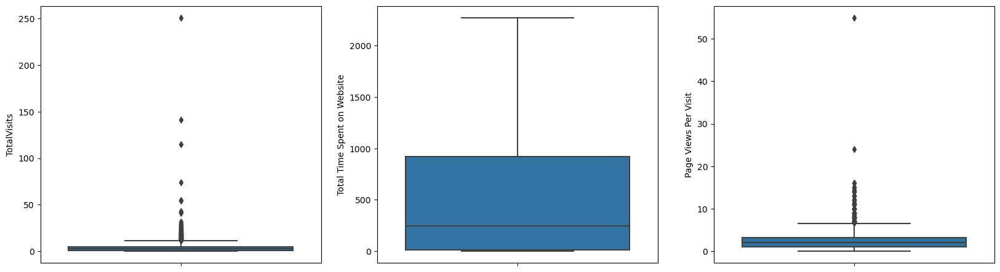

In [43]:
# Check the outliers in all the numeric columns

plt.figure(figsize=(20, 25))
plt.subplot(4,3,1)
sns.boxplot(y = 'TotalVisits', data = df)
plt.subplot(4,3,2)
sns.boxplot(y = 'Total Time Spent on Website', data = df)
plt.subplot(4,3,3)
sns.boxplot(y = 'Page Views Per Visit', data = df)
plt.show()

In [44]:
percentile_99 = df.TotalVisits.quantile(0.99)

In [45]:
df_v1 = df.loc[df.TotalVisits < percentile_99]

In [46]:
df_v1.describe(percentiles=[0.01,0.1,.25,.5,.75,.90,.95,.99])


,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000
mean,617076.749526,0.378496,3.192535,481.180724,2.341840
std,23355.580783,0.485039,2.934948,545.041857,2.060971
min,579533.000000,0.000000,0.000000,0.000000,0.000000
1%,580310.400000,0.000000,0.000000,0.000000,0.000000
10%,586307.400000,0.000000,0.000000,0.000000,0.000000
25%,596424.500000,0.000000,1.000000,8.500000,1.000000
50%,615429.000000,0.000000,3.000000,244.000000,2.000000
75%,637187.500000,1.000000,5.000000,919.500000,3.000000
90%,650308.600000,1.000000,7.000000,1372.000000,5.000000


In [47]:
df_v1.shape

(8975, 13)

In [48]:
8975/9240

0.9713203463203464

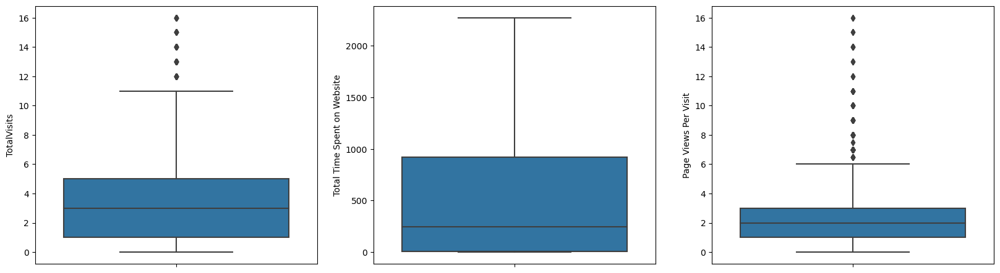

In [49]:
# Check the outliers in all the numeric columns

plt.figure(figsize=(20, 25))
plt.subplot(4,3,1)
sns.boxplot(y = 'TotalVisits', data = df_v1)
plt.subplot(4,3,2)
sns.boxplot(y = 'Total Time Spent on Website', data = df_v1)
plt.subplot(4,3,3)
sns.boxplot(y = 'Page Views Per Visit', data = df_v1)
plt.show()

we have 97% of the data treated after Outlier treatment


<AxesSubplot:xlabel='Lead Origin'>

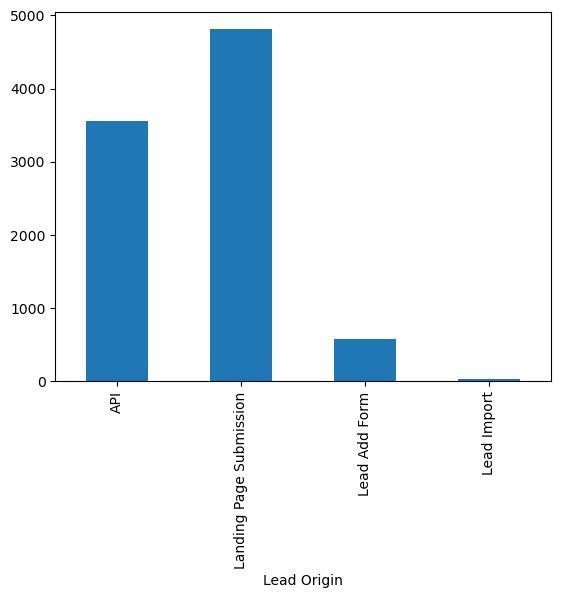

In [50]:
# Analysing/visualizing the categorical columns
# to see how predictor variable stands against the target variable or total count
df_v1.groupby(['Lead Origin'])['Prospect ID'].count().plot.bar()

<AxesSubplot:xlabel='Last Activity'>

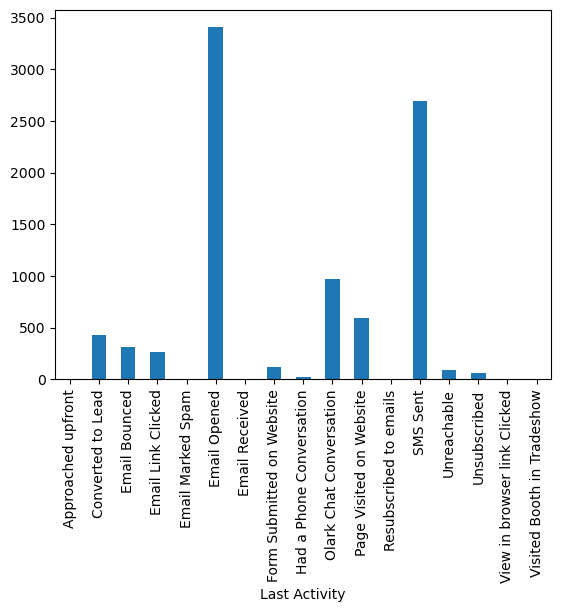

In [51]:
df_v1.groupby(['Last Activity'])['Prospect ID'].count().plot.bar()

In [52]:
df_v1.groupby(['Last Activity'])['Prospect ID'].count()*100/len(df_v1.index)

Last Activity
Approached upfront               0.055710
Converted to Lead                4.768802
Email Bounced                    3.465181
Email Link Clicked               2.963788
Email Marked Spam                0.022284
Email Opened                    37.961003
Email Received                   0.022284
Form Submitted on Website        1.270195
Had a Phone Conversation         0.267409
Olark Chat Conversation         10.796657
Page Visited on Website          6.629526
Resubscribed to emails           0.011142
SMS Sent                        30.050139
Unreachable                      0.991643
Unsubscribed                     0.657382
View in browser link Clicked     0.055710
Visited Booth in Tradeshow       0.011142
Name: Prospect ID, dtype: float64

A lot of categories in Last Activity can be clubbed in 'Others' as they are less than 1% of the data, such as Approached upfront, email marked spam etc

In [53]:
df_v1.loc[df_v1['Last Activity'].isin(['Approached upfront', 'Email Marked Spam', 'Email Received', 'Had a Phone Conversation', \
                                      'Had a Phone Conversation', 'Resubscribed to emails', 'Unreachable', 'Unsubscribed', \
                                       'View in browser link Clicked', 'Visited Booth in Tradeshow'
                                      ]), 'Last Activity'] = 'Others'

<AxesSubplot:xlabel='Last Activity'>

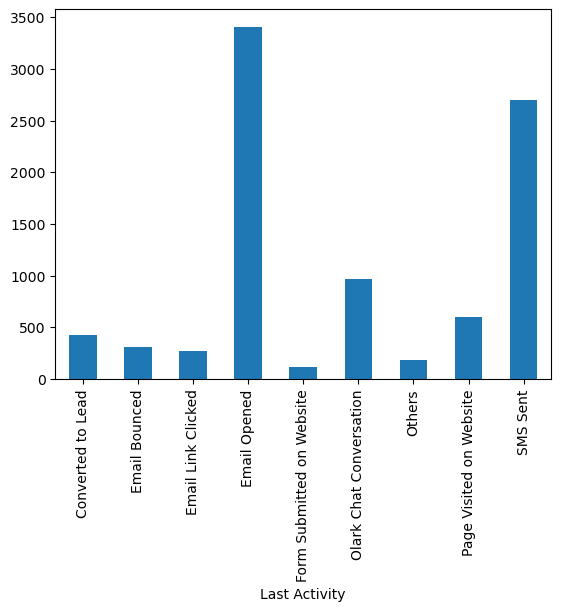

In [54]:
df_v1.groupby(['Last Activity'])['Prospect ID'].count().plot.bar()

<AxesSubplot:xlabel='Do Not Email'>

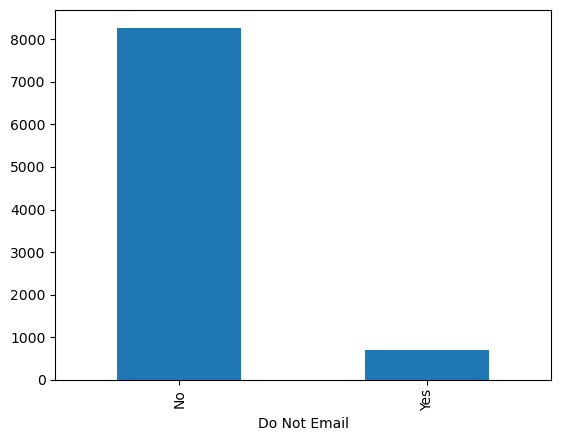

In [55]:
df_v1.groupby(['Do Not Email'])['Prospect ID'].count().plot.bar()

<AxesSubplot:xlabel='Lead Source'>

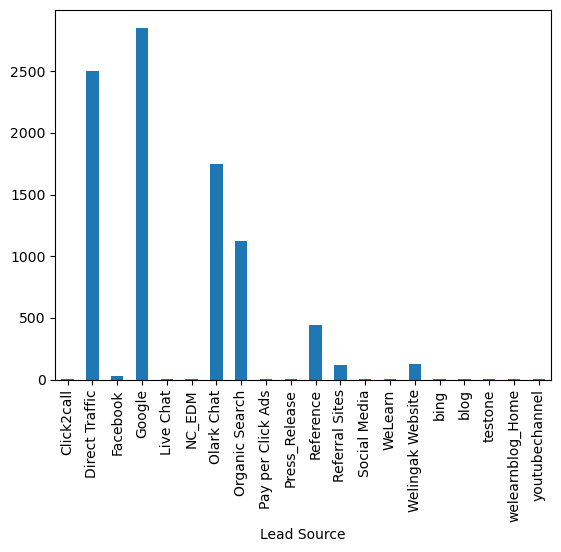

In [56]:
df_v1.groupby(['Lead Source'])['Prospect ID'].count().plot.bar()

In [57]:
df_v1.groupby(['Lead Source'])['Prospect ID'].count()*100/len(df_v1.index)

Lead Source
Click2call            0.044568
Direct Traffic       27.910864
Facebook              0.345404
Google               31.799443
Live Chat             0.022284
NC_EDM                0.011142
Olark Chat           19.487465
Organic Search       12.479109
Pay per Click Ads     0.011142
Press_Release         0.022284
Reference             4.924791
Referral Sites        1.359331
Social Media          0.022284
WeLearn               0.011142
Welingak Website      1.437326
bing                  0.066852
blog                  0.011142
testone               0.011142
welearnblog_Home      0.011142
youtubechannel        0.011142
Name: Prospect ID, dtype: float64

Here too a lot of sources which are less than 1% can be clubbed as 'Other' sources

In [58]:
df_v1.loc[df_v1['Lead Source'].isin(['Click2call', 'Facebook', 'Live Chat', 'NC_EDM', 'Pay per Click Ads', \
                                      'Press_Release', 'Social Media', 'WeLearn', 'bing', 'blog', \
                                       'testone', 'welearnblog_Home', 'youtubechannel'
                                      ]), 'Lead Source'] = 'Others'

<AxesSubplot:xlabel='Lead Source'>

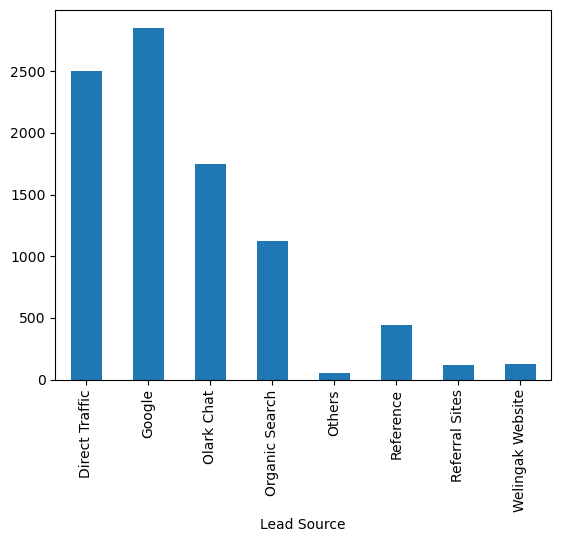

In [59]:
df_v1.groupby(['Lead Source'])['Prospect ID'].count().plot.bar()

<AxesSubplot:xlabel='What is your current occupation'>

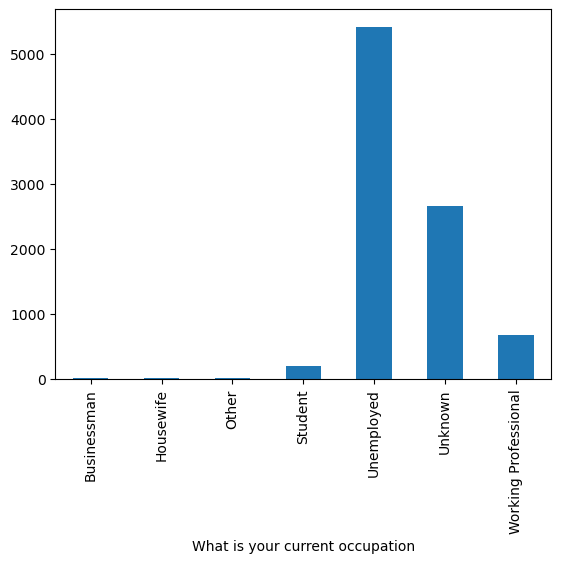

In [60]:

df_v1.groupby(['What is your current occupation'])['Prospect ID'].count().plot.bar()

In [61]:
df_v1.loc[df_v1['What is your current occupation'].isin(['Businessman', 'Housewife', 'Other']),\
          'What is your current occupation'] = 'Others'

<AxesSubplot:xlabel='What is your current occupation'>

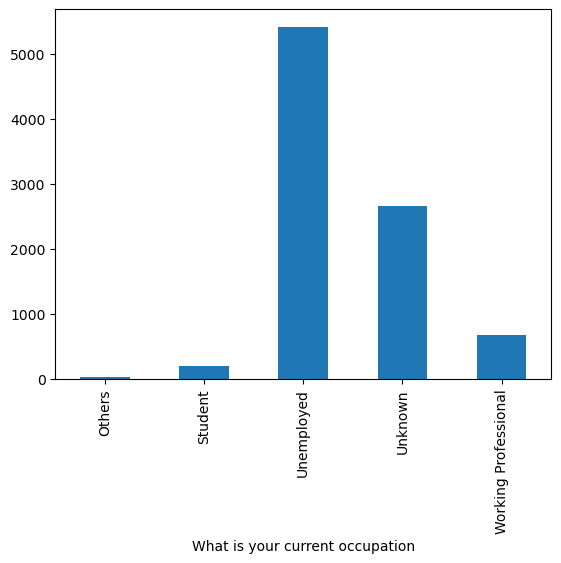

In [62]:

df_v1.groupby(['What is your current occupation'])['Prospect ID'].count().plot.bar()

<AxesSubplot:xlabel='A free copy of Mastering The Interview'>

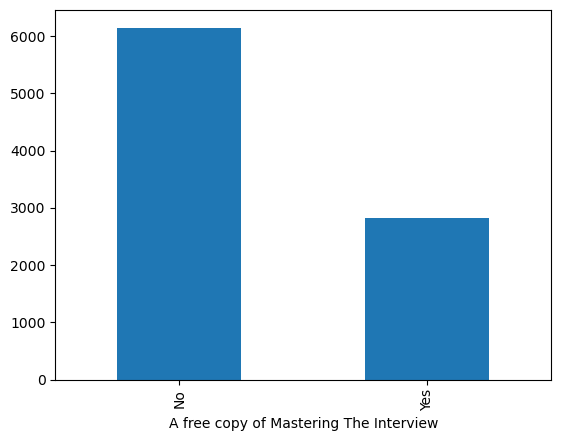

In [63]:
df_v1.groupby(['A free copy of Mastering The Interview'])['Prospect ID'].count().plot.bar()

<AxesSubplot:xlabel='Last Notable Activity'>

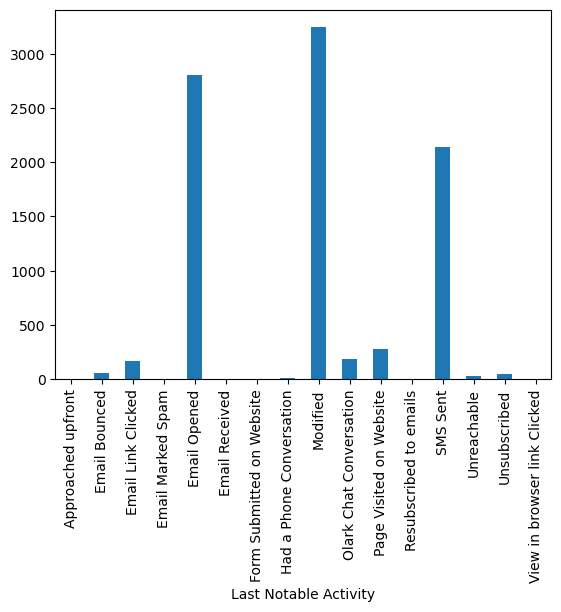

In [64]:
df_v1.groupby(['Last Notable Activity'])['Prospect ID'].count().plot.bar()

In [65]:
df_v1.groupby(['Last Notable Activity'])['Prospect ID'].count()*100/len(df_v1.index)

Last Notable Activity
Approached upfront               0.011142
Email Bounced                    0.657382
Email Link Clicked               1.916435
Email Marked Spam                0.022284
Email Opened                    31.208914
Email Received                   0.011142
Form Submitted on Website        0.011142
Had a Phone Conversation         0.144847
Modified                        36.144847
Olark Chat Conversation          2.027855
Page Visited on Website          3.153203
Resubscribed to emails           0.011142
SMS Sent                        23.810585
Unreachable                      0.356546
Unsubscribed                     0.501393
View in browser link Clicked     0.011142
Name: Prospect ID, dtype: float64

Marking the activities which are less than 1% as one single activity of 'Others'

In [66]:
df_v1.loc[df_v1['Last Notable Activity'].isin(['Approached upfront', 'Email Bounced', 'Email Marked Spam', 'Email Received', \
                                      'Form Submitted on Website', 'Had a Phone Conversation', 'Resubscribed to emails', \
                                       'Unreachable', 'Unsubscribed', 'View in browser link Clicked'
                                      ]), 'Last Notable Activity'] = 'Others'


<AxesSubplot:xlabel='Last Notable Activity'>

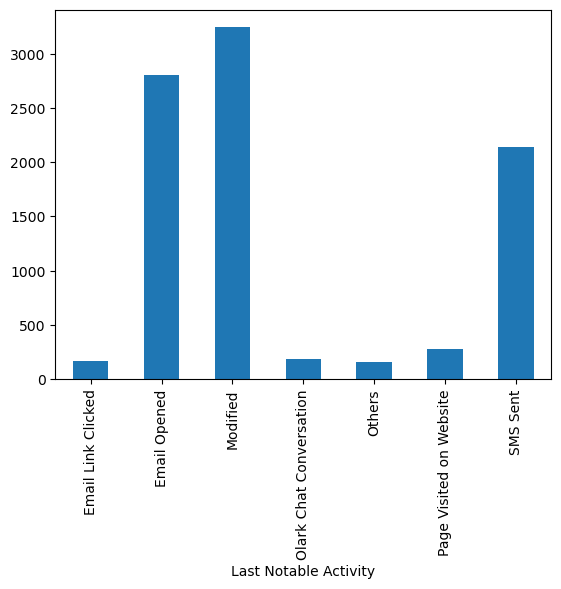

In [67]:
df_v1.groupby(['Last Notable Activity'])['Prospect ID'].count().plot.bar()

In [68]:
df_v1.groupby(['Last Notable Activity'])['Prospect ID'].count()*100/len(df_v1.index)

Last Notable Activity
Email Link Clicked          1.916435
Email Opened               31.208914
Modified                   36.144847
Olark Chat Conversation     2.027855
Others                      1.738162
Page Visited on Website     3.153203
SMS Sent                   23.810585
Name: Prospect ID, dtype: float64

In all the categories that were clubbed in all the variables, the Other categories are still a minority as we saw, thus not disturbing the skew of the data as well but removing some noise without removing data

## Bivariate analysis to see the performance with the Target variable - Converted

In [69]:
df_v1.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'What is your current occupation',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

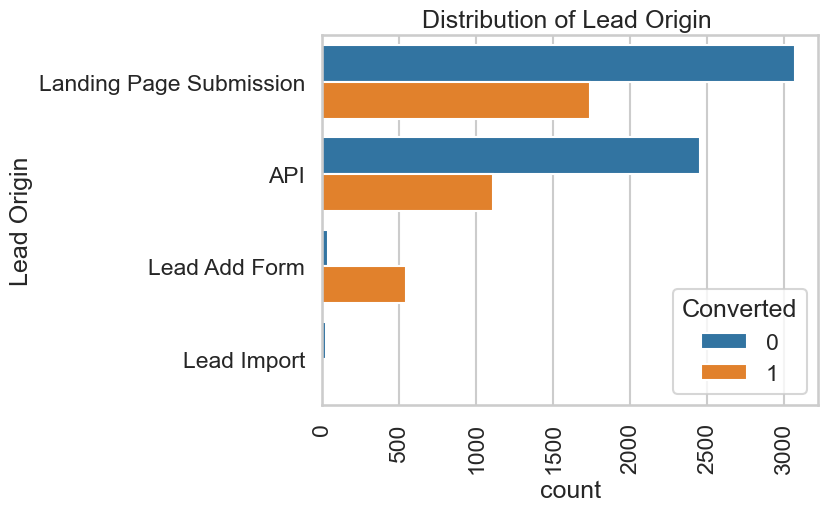

In [70]:
sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Lead Origin ')
ax = sns.countplot(data = df_v1, y= 'Lead Origin', 
                   order=df_v1['Lead Origin'].value_counts().index,hue = 'Converted') 




Lead Add Form as Lead origin definitely leads to Conversion

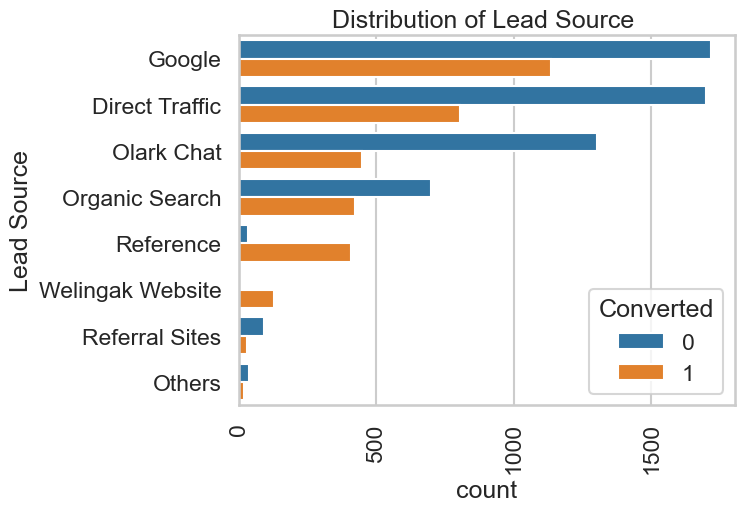

In [71]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Lead Source ')
ax = sns.countplot(data = df_v1, y= 'Lead Source', 
                   order=df_v1['Lead Source'].value_counts().index,hue = 'Converted') 




Reference and Organic search have a better conversion rate

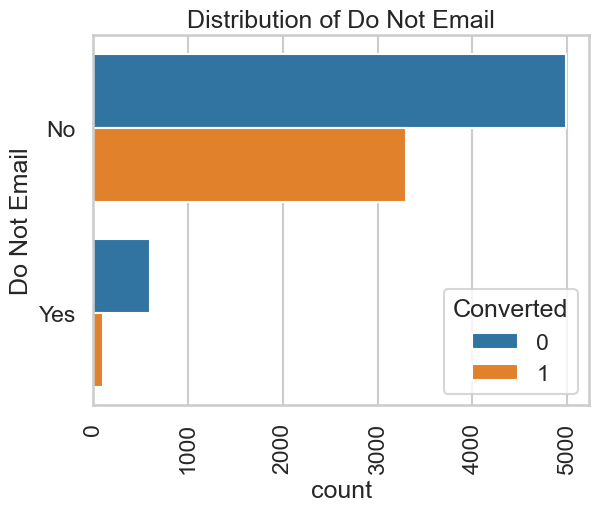

In [72]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Do Not Email')
ax = sns.countplot(data = df_v1, y= 'Do Not Email', 
                   order=df_v1['Do Not Email'].value_counts().index,hue = 'Converted') 




Do not email do not show a strong correlation on conversion

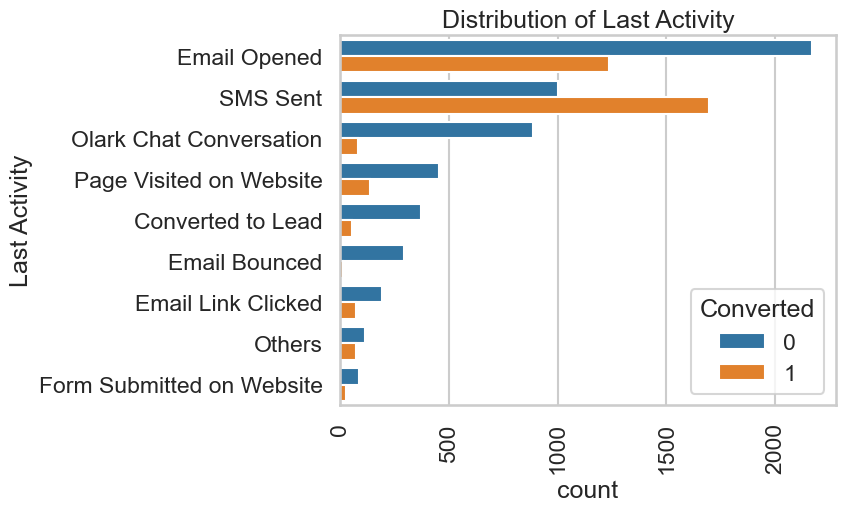

In [73]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Last Activity')
ax = sns.countplot(data = df_v1, y= 'Last Activity', 
                   order=df_v1['Last Activity'].value_counts().index,hue = 'Converted') 



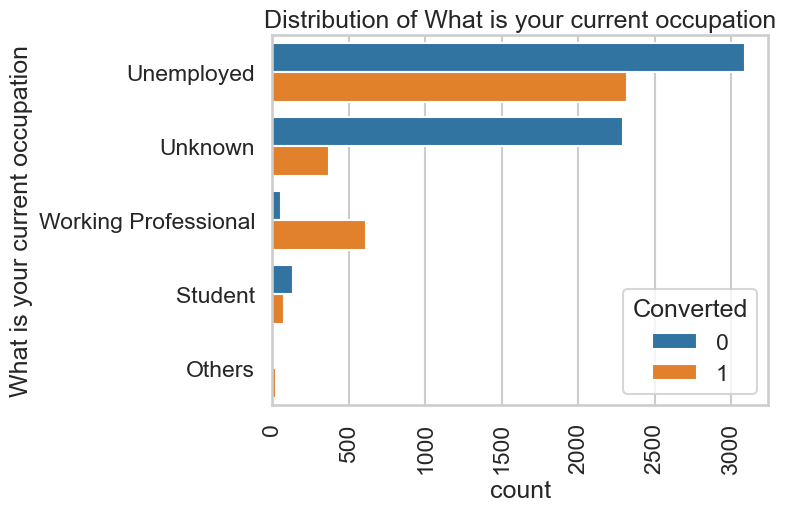

In [74]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of What is your current occupation')
ax = sns.countplot(data = df_v1, y= 'What is your current occupation', 
                   order=df_v1['What is your current occupation'].value_counts().index,hue = 'Converted') 



Working Professionals are highest converting customers and and among the majority of the population which is unemployment rate, they also show high conversion
Students are a small chunk of population

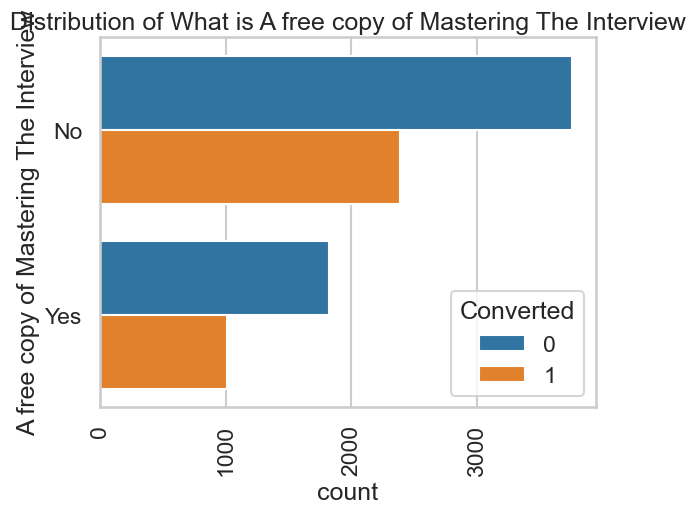

In [75]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of What is A free copy of Mastering The Interview')
ax = sns.countplot(data = df_v1, y= 'A free copy of Mastering The Interview', 
                   order=df_v1['A free copy of Mastering The Interview'].value_counts().index,hue = 'Converted') 


No strong Correlation on the same

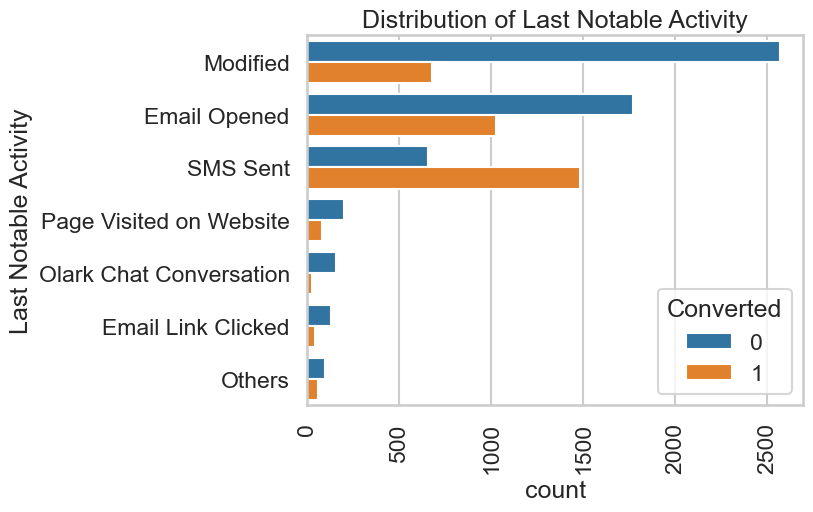

In [76]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Last Notable Activity')
ax = sns.countplot(data = df_v1, y= 'Last Notable Activity', 
                   order=df_v1['Last Notable Activity'].value_counts().index,hue = 'Converted') 


Like Last Activity, Last notable activity shows higher converion with SMS Sent followed by Email Opened

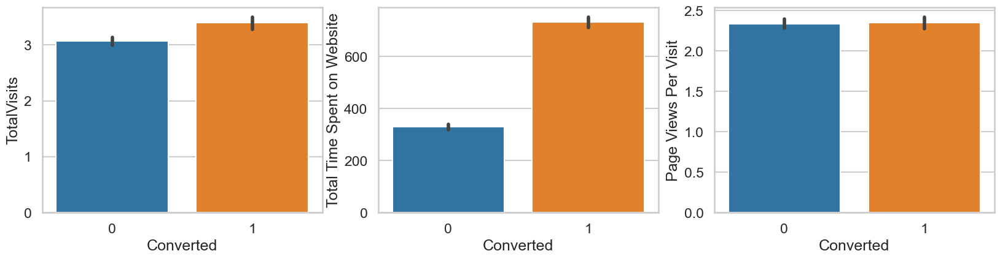

In [77]:
# Now check the conversions for all numeric values

plt.figure(figsize=(20,20))
plt.subplot(4,3,1)
sns.barplot(y = 'TotalVisits', x='Converted', data = df_v1)
plt.subplot(4,3,2)
sns.barplot(y = 'Total Time Spent on Website', x='Converted', data = df_v1)
plt.subplot(4,3,3)
sns.barplot(y = 'Page Views Per Visit', x='Converted', data = df_v1)
plt.show()

- The conversion rated were high for Total Visits more than 5 
- The higher the Total Time Spent on Website, the more is the conversion
- Page Views Per Visit doesnt show a strong correlation with conversion

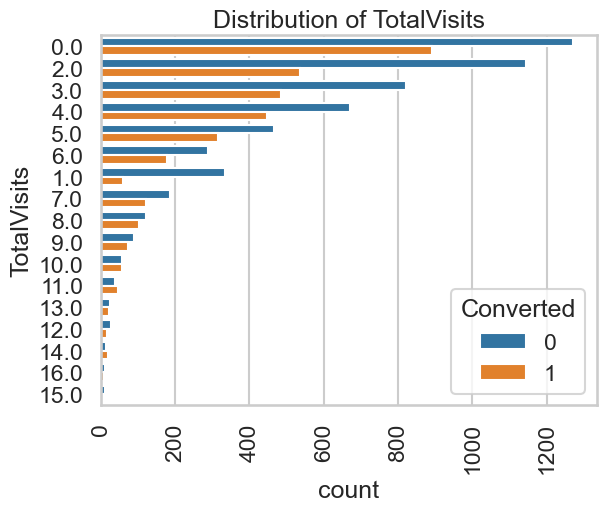

In [78]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of TotalVisits')
ax = sns.countplot(data = df_v1, y= 'TotalVisits', 
                   order=df_v1['TotalVisits'].value_counts().index,hue = 'Converted') 



In [79]:
df_v1.loc[df_v1.TotalVisits<=5, 'Total_visit_bin1'] = '0-5'
df_v1.loc[(df_v1.TotalVisits>5)&(df_v1.TotalVisits<=10), 'Total_visit_bin1'] = '6-10'
df_v1.loc[df_v1.TotalVisits>10, 'Total_visit_bin1'] = '10-15'

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/1747046709.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_v1.loc[df_v1.TotalVisits<=5, 'Total_visit_bin1'] = '0-5'


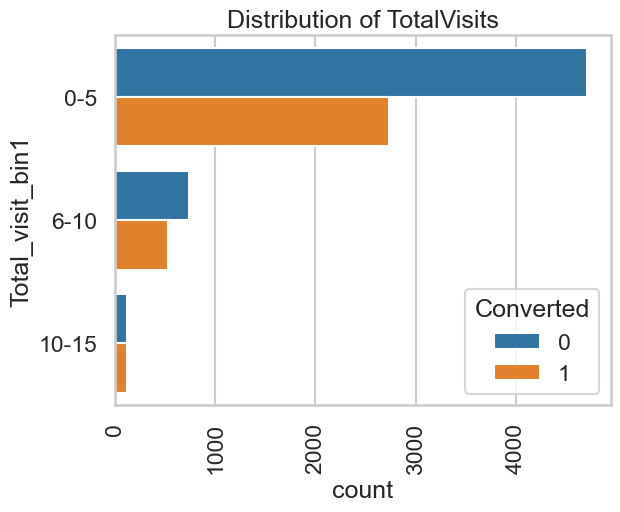

In [80]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)

# bins = np.histogram_bin_edges(df_v1['TotalVisits'], bins='auto')

# plt.xscale('log')
plt.title('Distribution of TotalVisits')
ax = sns.countplot(data = df_v1, y= 'Total_visit_bin1', 
                   order=df_v1['Total_visit_bin1'].value_counts().index,hue = 'Converted') 



TotalVisits >5 have a much higher conversion rate

In [81]:
df_v1.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,8975.000000,8975.000000,8975.000000,8975.000000,8975.000000
mean,617076.749526,0.378496,3.192535,481.180724,2.341840
std,23355.580783,0.485039,2.934948,545.041857,2.060971
min,579533.000000,0.000000,0.000000,0.000000,0.000000
25%,596424.500000,0.000000,1.000000,8.500000,1.000000
50%,615429.000000,0.000000,3.000000,244.000000,2.000000
75%,637187.500000,1.000000,5.000000,919.500000,3.000000
max,660737.000000,1.000000,16.000000,2272.000000,16.000000


In [82]:
df_v1.loc[df_v1['Page Views Per Visit']<=1, 'Page_view_bin1'] = '0-1'
df_v1.loc[(df_v1['Page Views Per Visit']>1)&(df_v1['Page Views Per Visit']<=2), 'Page_view_bin1'] = '1-2'
df_v1.loc[(df_v1['Page Views Per Visit']>2)&(df_v1['Page Views Per Visit']<=3), 'Page_view_bin1'] = '2-3'
df_v1.loc[df_v1['Page Views Per Visit']>3, 'Page_view_bin1'] = '3+'

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/2975329012.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_v1.loc[df_v1['Page Views Per Visit']<=1, 'Page_view_bin1'] = '0-1'


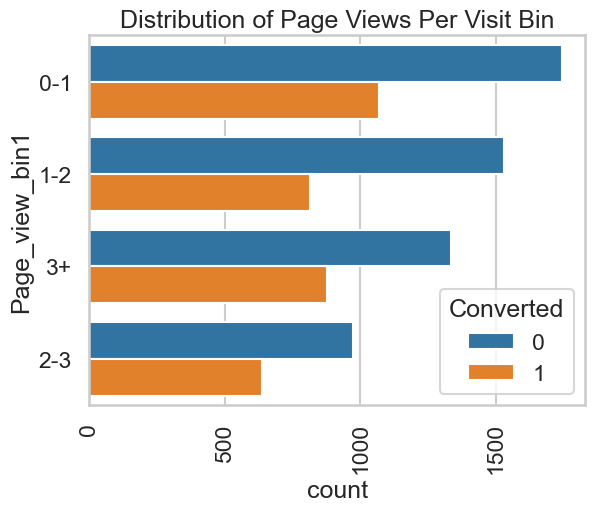

In [83]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Page Views Per Visit Bin')
ax = sns.countplot(data = df_v1, y= 'Page_view_bin1', 
                   order=df_v1['Page_view_bin1'].value_counts().index,hue = 'Converted') 



As we can see, bins with Page views per visit greater than 2 show higher conversion rate


In [84]:
df_v1.loc[df_v1['Total Time Spent on Website']<=300, 'Total_time_spent_on_Website_bin1'] = '0-300'
# df_v1.loc[(df_v1['Page Views Per Visit']>1)&(df_v1['Page Views Per Visit']<=2), 'Page_view_bin1'] = '1-2'
# df_v1.loc[(df_v1['Page Views Per Visit']>2)&(df_v1['Page Views Per Visit']<=3), 'Page_view_bin1'] = '2-3'
df_v1.loc[df_v1['Total Time Spent on Website']>300, 'Total_time_spent_on_Website_bin1'] = '300++'

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/2682400907.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_v1.loc[df_v1['Total Time Spent on Website']<=300, 'Total_time_spent_on_Website_bin1'] = '0-300'


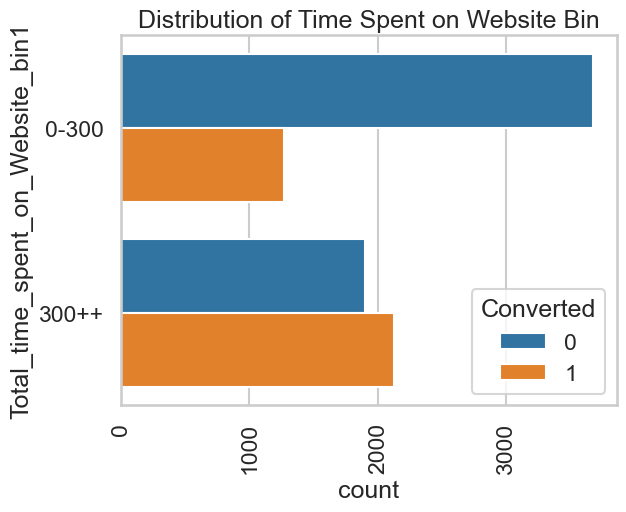

In [85]:
sns.set_style('whitegrid')
sns.set_context('talk')
# Column = 'Lead Source'
plt.figure()
plt.xticks(rotation=90)
# plt.xscale('log')
plt.title('Distribution of Time Spent on Website Bin')
ax = sns.countplot(data = df_v1, y= 'Total_time_spent_on_Website_bin1', 
                   order=df_v1['Total_time_spent_on_Website_bin1'].value_counts().index,hue = 'Converted') 


Customers with more than 300 Seconds spent on website have a significantly high conversion rate

## Plotting Correlation Heatmap

In [86]:
corr_df = df_v1.select_dtypes(include=["int64","float64"]).corr()
corr_df

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
Lead Number,1.000000,0.023479,0.053521,0.019029,0.062853
Converted,0.023479,1.000000,0.054165,0.358764,0.002871
TotalVisits,0.053521,0.054165,1.000000,0.352989,0.748489
Total Time Spent on Website,0.019029,0.358764,0.352989,1.000000,0.334988
Page Views Per Visit,0.062853,0.002871,0.748489,0.334988,1.000000


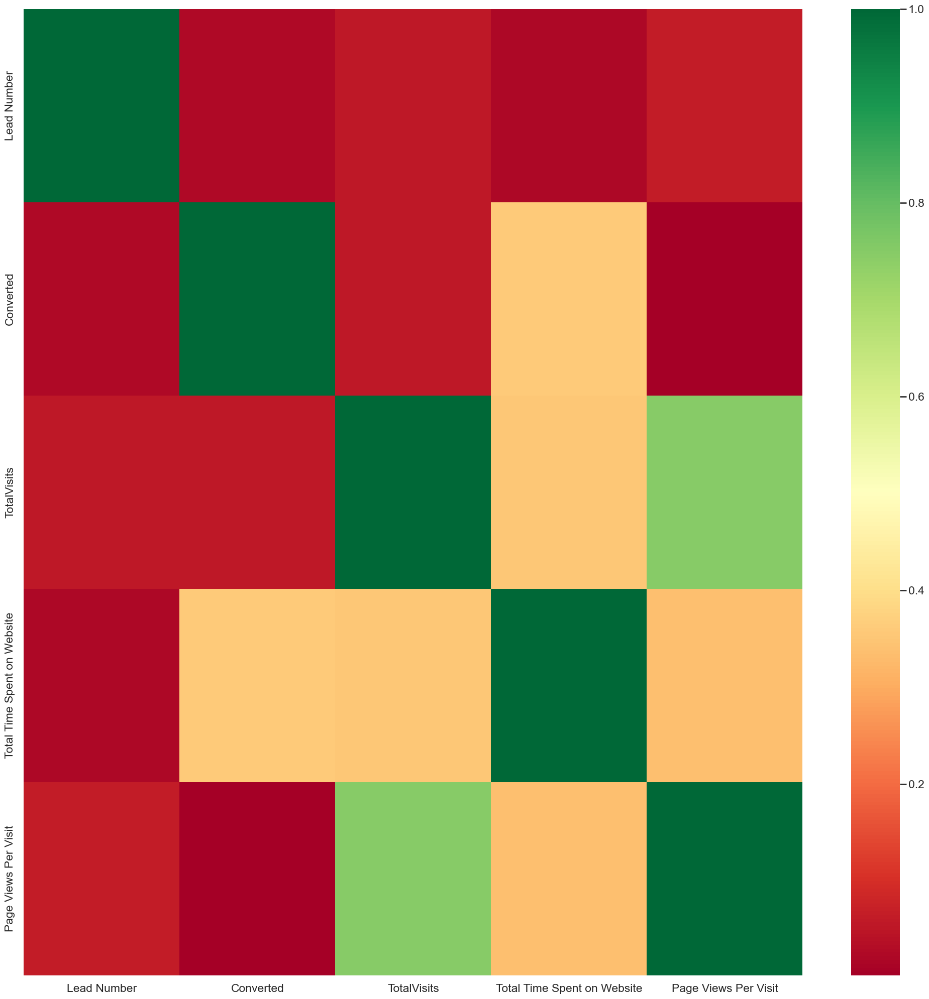

In [87]:
plt.figure(figsize = (25,25))
sns.heatmap(data = corr_df, cmap = "RdYlGn", cbar = True)
plt.show()

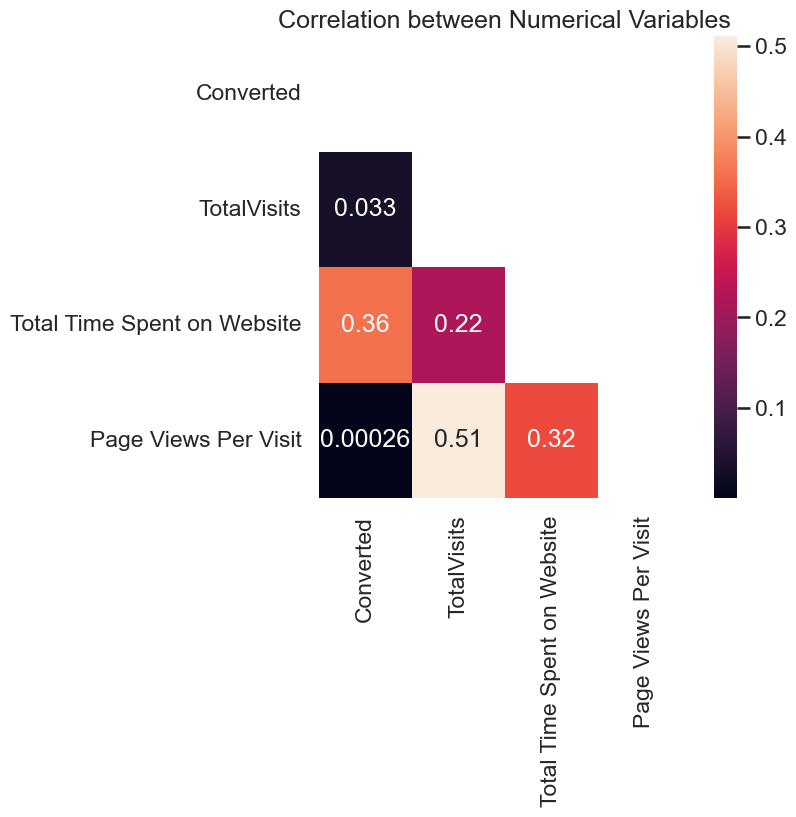

In [88]:
plt.figure(figsize = (6,6))
matrix = np.triu(df_v1[['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit']].corr())
sns.heatmap(df[['Converted','TotalVisits','Total Time Spent on Website','Page Views Per Visit']].corr(), annot = True, mask=matrix)
plt.title("Correlation between Numerical Variables")
plt.show()

# Data Preparation for Modelling

Creating Binary Variables, and dummy Variables

In [89]:
variablelist =  ['Do Not Email', 'A free copy of Mastering The Interview']

# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the columns
df_v1[variablelist] = df_v1[variablelist].apply(binary_map)

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/1609521346.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_v1[variablelist] = df_v1[variablelist].apply(binary_map)


In [90]:
df_v1.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,What is your current occupation,A free copy of Mastering The Interview,Last Notable Activity,Total_visit_bin1,Page_view_bin1,Total_time_spent_on_Website_bin1
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Unemployed,0,Modified,0-5,0-1,0-300
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Unemployed,0,Email Opened,0-5,2-3,300++
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Student,1,Email Opened,0-5,1-2,300++
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Others,Unemployed,0,Modified,0-5,0-1,300++
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Unemployed,0,Modified,0-5,0-1,300++


In [91]:
df_v1.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'What is your current occupation',
       'A free copy of Mastering The Interview', 'Last Notable Activity',
       'Total_visit_bin1', 'Page_view_bin1',
       'Total_time_spent_on_Website_bin1'],
      dtype='object')

In [92]:
# One hot encoding on categorical columns.
df_temp = pd.get_dummies(df_v1,columns=['Lead Origin', 'Lead Source','Last Activity',\
                                        'What is your current occupation','A free copy of Mastering The Interview', \
                                        'Last Notable Activity','Total_visit_bin1', 'Page_view_bin1',\
                                        'Total_time_spent_on_Website_bin1'],drop_first=True)


df_new = pd.concat([df_v1,df_temp],axis=1)

In [93]:
df_new = df_new.loc[:,~df_new.columns.duplicated()].copy()

In [94]:
df_new.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,What is your current occupation,A free copy of Mastering The Interview,Last Notable Activity,Total_visit_bin1,Page_view_bin1,Total_time_spent_on_Website_bin1,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Unknown,What is your current occupation_Working Professional,A free copy of Mastering The Interview_1,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Others,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Total_visit_bin1_10-15,Total_visit_bin1_6-10,Page_view_bin1_1-2,Page_view_bin1_2-3,Page_view_bin1_3+,Total_time_spent_on_Website_bin1_300++
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Unemployed,0,Modified,0-5,0-1,0-300,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Unemployed,0,Email Opened,0-5,2-3,300++,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Student,1,Email Opened,0-5,1-2,300++,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Others,Unemployed,0,Modified,0-5,0-1,300++,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Unemployed,0,Modified,0-5,0-1,300++,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


In [95]:
# removing textual columns after creating dummies

df_new.drop(['Lead Origin', 'Lead Source','Last Activity', 'What is your current occupation',\
             'A free copy of Mastering The Interview', 'Last Notable Activity','Total_visit_bin1', 'Page_view_bin1',\
             'Total_time_spent_on_Website_bin1'], axis = 1, inplace=True)

In [96]:
# check the shape of new dataframe

df_new.shape

(8975, 42)

In [97]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8975 entries, 0 to 9239
Data columns (total 42 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Prospect ID                                           8975 non-null   object 
 1   Lead Number                                           8975 non-null   int64  
 2   Do Not Email                                          8975 non-null   int64  
 3   Converted                                             8975 non-null   int64  
 4   TotalVisits                                           8975 non-null   float64
 5   Total Time Spent on Website                           8975 non-null   int64  
 6   Page Views Per Visit                                  8975 non-null   float64
 7   Lead Origin_Landing Page Submission                   8975 non-null   uint8  
 8   Lead Origin_Lead Add Form                             8975

In [98]:
df_new.drop(['Prospect ID'], axis = 1, inplace=True)

In [99]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8975 entries, 0 to 9239
Data columns (total 41 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   Lead Number                                           8975 non-null   int64  
 1   Do Not Email                                          8975 non-null   int64  
 2   Converted                                             8975 non-null   int64  
 3   TotalVisits                                           8975 non-null   float64
 4   Total Time Spent on Website                           8975 non-null   int64  
 5   Page Views Per Visit                                  8975 non-null   float64
 6   Lead Origin_Landing Page Submission                   8975 non-null   uint8  
 7   Lead Origin_Lead Add Form                             8975 non-null   uint8  
 8   Lead Origin_Lead Import                               8975

In [100]:
df_new.head()

,Lead Number,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Unknown,What is your current occupation_Working Professional,A free copy of Mastering The Interview_1,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Others,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Total_visit_bin1_10-15,Total_visit_bin1_6-10,Page_view_bin1_1-2,Page_view_bin1_2-3,Page_view_bin1_3+,Total_time_spent_on_Website_bin1_300++
0,660737,0,0,0.0,0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,660728,0,0,5.0,674,2.5,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
2,660727,0,1,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1
3,660719,0,0,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
4,660681,0,1,2.0,1428,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


## Preparring the data for Training (Train-Test Split)

In [101]:

# Put all the feature variables in X

X = df_new.drop(['Converted'], 1)
X.head()

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/1289268064.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X = df_new.drop(['Converted'], 1)


,Lead Number,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Unknown,What is your current occupation_Working Professional,A free copy of Mastering The Interview_1,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Others,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Total_visit_bin1_10-15,Total_visit_bin1_6-10,Page_view_bin1_1-2,Page_view_bin1_2-3,Page_view_bin1_3+,Total_time_spent_on_Website_bin1_300++
0,660737,0,0.0,0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,660728,0,5.0,674,2.5,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1
2,660727,0,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1
3,660719,0,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
4,660681,0,2.0,1428,1.0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1


In [102]:
# Put the target variable in y

y = df_new['Converted']

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [103]:
# Split the dataset into 70% train and 30% test

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)


In [104]:
# Using MinMaxScaler to Rescaling the features

scaler = MinMaxScaler()

# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables

num_vars = ['TotalVisits','Total Time Spent on Website','Page Views Per Visit']
X_train[num_vars] = scaler.fit_transform(X_train[num_vars])

In [105]:
# describing the dataset

X_train.describe()

,Lead Number,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Others,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Others,Last Activity_Page Visited on Website,Last Activity_SMS Sent,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Unknown,What is your current occupation_Working Professional,A free copy of Mastering The Interview_1,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Others,Last Notable Activity_Page Visited on Website,Last Notable Activity_SMS Sent,Total_visit_bin1_10-15,Total_visit_bin1_6-10,Page_view_bin1_1-2,Page_view_bin1_2-3,Page_view_bin1_3+,Total_time_spent_on_Website_bin1_300++
count,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000,6282.000000
mean,617005.645654,0.080388,0.198922,0.211084,0.146116,0.539796,0.063196,0.003661,0.317892,0.197071,0.123368,0.005890,0.048074,0.013690,0.014167,0.036294,0.030564,0.381407,0.012257,0.108087,0.020535,0.067494,0.296562,0.025310,0.605540,0.292104,0.073384,0.315345,0.314868,0.359917,0.020057,0.017510,0.033429,0.234002,0.028176,0.141993,0.261382,0.178287,0.247214,0.449538
std,23275.076427,0.271915,0.182370,0.239973,0.128562,0.498453,0.243335,0.060402,0.465694,0.397818,0.328886,0.076525,0.213939,0.116209,0.118190,0.187036,0.172146,0.485771,0.110041,0.310514,0.141832,0.250896,0.456778,0.157079,0.488773,0.454766,0.260787,0.464690,0.464500,0.480014,0.140207,0.131173,0.179768,0.423407,0.165488,0.349071,0.439422,0.382785,0.431427,0.497487
min,579533.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,596455.750000,0.000000,0.062500,0.003081,0.062500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,615545.000000,0.000000,0.187500,0.106954,0.125000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,637013.000000,0.000000,0.312500,0.397227,0.187500,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
max,660728.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0

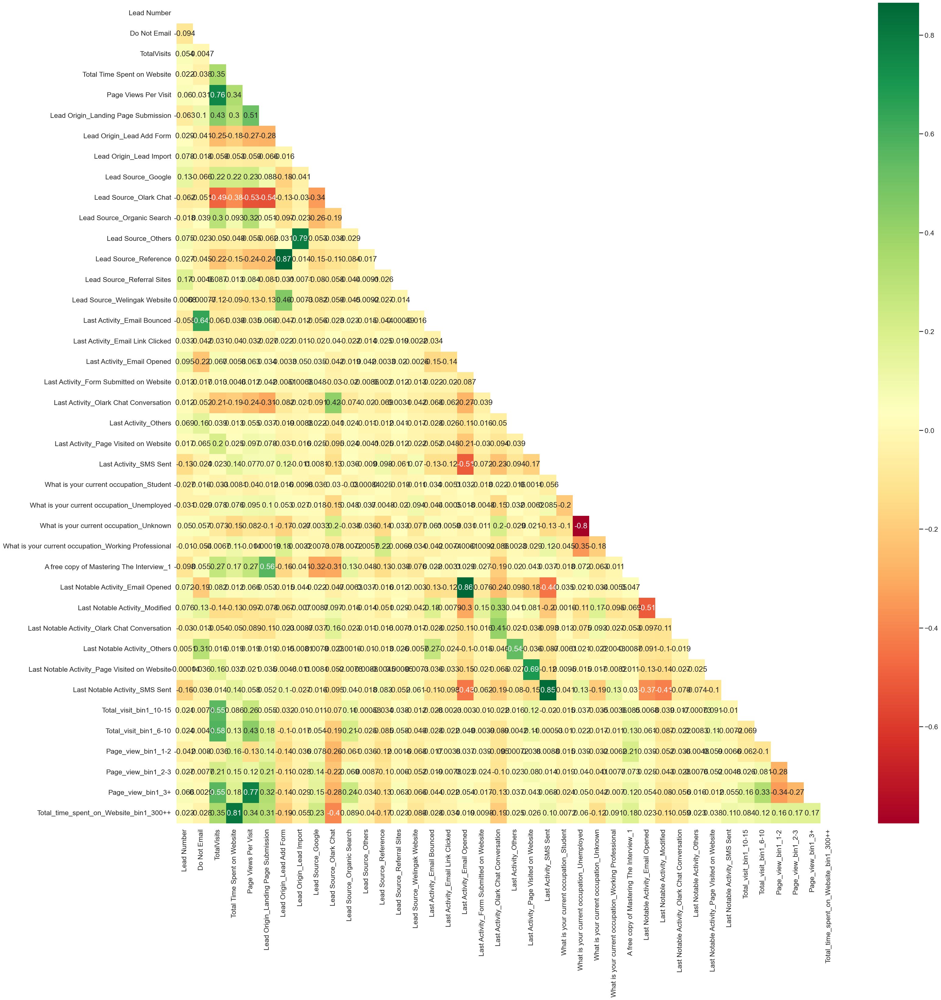

In [106]:
# check the correlation coefficients to see which variables are highly correlated

plt.figure(figsize = (35,35))
matrix = np.triu(X_train.corr())
sns.heatmap(X_train.corr(), annot = True, cmap="RdYlGn", mask=matrix)
plt.show()

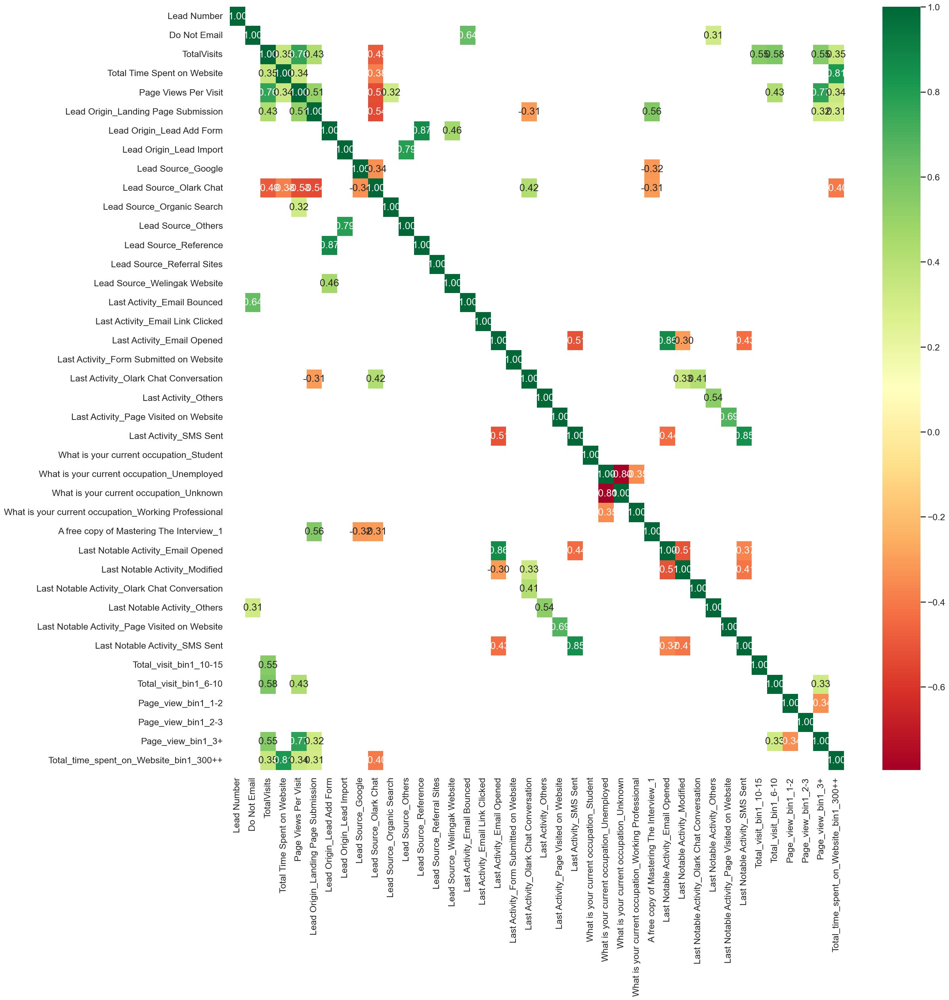

In [107]:
plt.figure(figsize = (25,25))
matrix = np.triu(X_train.corr())
sns.heatmap(data = X_train.corr()[(X_train.corr() >= 0.3) | (X_train.corr() < -0.3)], annot = True, cmap = "RdYlGn", cbar = True, fmt='.2f')
plt.show()


- Last Activity and Last Notable activity for SMS Sent in both show high correlation
- Current Occupation as Unknown and Unemployed show very high negative Correlation
- As expected, the bins created for the time spent on website and page views show high correlation with the latter

# Model Building

In [108]:
# Import 'LogisticRegression' and create a LogisticRegression object

from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [109]:
# Recursive feature elimination 

logreg.fit(X_train, y_train)

rfe = RFE(logreg, step = 15)
rfe = rfe.fit(X_train, y_train)

In [110]:
#List of variables selected in top 15 list

list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('Lead Number', True, 1),
 ('Do Not Email', True, 1),
 ('TotalVisits', False, 3),
 ('Total Time Spent on Website', True, 1),
 ('Page Views Per Visit', False, 3),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 3),
 ('Lead Source_Google', False, 3),
 ('Lead Source_Olark Chat', True, 1),
 ('Lead Source_Organic Search', False, 2),
 ('Lead Source_Others', False, 3),
 ('Lead Source_Reference', True, 1),
 ('Lead Source_Referral Sites', False, 3),
 ('Lead Source_Welingak Website', False, 2),
 ('Last Activity_Email Bounced', True, 1),
 ('Last Activity_Email Link Clicked', False, 3),
 ('Last Activity_Email Opened', True, 1),
 ('Last Activity_Form Submitted on Website', False, 3),
 ('Last Activity_Olark Chat Conversation', True, 1),
 ('Last Activity_Others', False, 3),
 ('Last Activity_Page Visited on Website', True, 1),
 ('Last Activity_SMS Sent', True, 1),
 ('What is your current occupation_Student', False, 3),
 (

In [111]:
# selecting the selected variable via RFE in col list

col = X_train.columns[rfe.support_]
print(col)

Index(['Lead Number', 'Do Not Email', 'Total Time Spent on Website',
       'Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Olark Chat', 'Lead Source_Reference',
       'Last Activity_Email Bounced', 'Last Activity_Email Opened',
       'Last Activity_Olark Chat Conversation',
       'Last Activity_Page Visited on Website', 'Last Activity_SMS Sent',
       'What is your current occupation_Unknown',
       'What is your current occupation_Working Professional',
       'A free copy of Mastering The Interview_1',
       'Last Notable Activity_Email Opened', 'Last Notable Activity_Modified',
       'Last Notable Activity_SMS Sent', 'Page_view_bin1_1-2',
       'Total_time_spent_on_Website_bin1_300++'],
      dtype='object')


In [112]:
# checking which columns has been rejected

X_train.columns[~rfe.support_]

Index(['TotalVisits', 'Page Views Per Visit', 'Lead Origin_Lead Import',
       'Lead Source_Google', 'Lead Source_Organic Search',
       'Lead Source_Others', 'Lead Source_Referral Sites',
       'Lead Source_Welingak Website', 'Last Activity_Email Link Clicked',
       'Last Activity_Form Submitted on Website', 'Last Activity_Others',
       'What is your current occupation_Student',
       'What is your current occupation_Unemployed',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_Others',
       'Last Notable Activity_Page Visited on Website',
       'Total_visit_bin1_10-15', 'Total_visit_bin1_6-10', 'Page_view_bin1_2-3',
       'Page_view_bin1_3+'],
      dtype='object')

In [113]:
# Generic function to calculate VIF of variables

def calculateVIF(df):
    vif = pd.DataFrame()
    vif['Features'] = df.columns
    vif['VIF'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif 

In [114]:
# dataframe with RFE selected variables

X_train_rfe = X_train[col]

In [115]:
# calculate VIF

calculateVIF(X_train_rfe)

,Features,VIF
0,Lead Number,24.14
15,Last Notable Activity_Email Opened,10.95
8,Last Activity_Email Opened,9.80
17,Last Notable Activity_SMS Sent,8.63
11,Last Activity_SMS Sent,7.93
16,Last Notable Activity_Modified,5.93
19,Total_time_spent_on_Website_bin1_300++,5.56
2,Total Time Spent on Website,5.44
3,Lead Origin_Landing Page Submission,4.85
4,Lead Origin_Lead Add Form,4.73


Lead Number, Last Notable Activity_Email Opened, Last Activity_Email Opened	, Last Notable Activity_SMS Sent and Last Activity_SMS Sent show high VIF

In [116]:
# Fit a logistic Regression model on X_train after adding a constant and output the summary

X_train_sm = sm.add_constant(X_train_rfe)
logm2 = sm.GLM(y_train, X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6282
Model:                            GLM   Df Residuals:                     6261
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2510.3
Date:                Mon, 19 Jun 2023   Deviance:                       5020.7
Time:                        22:14:50   Pearson chi2:                 6.35e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4074
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -6.7391      1.015     -6.640      0.000      -8.728      -4.750
Lead Number                                           8.045e-06   1.59e-06      5.058      0.000    4.93e-06    1.12e-05
Do Not Email                                            -1.0644      0.200     -5.318      0.000      -1.457      -0.672
Total Time Spent on Website                              4.0201      0.246     16.345      0.000       3.538       4.502
Lead Origin_Landing Page Submission                     -0.2605      0.104     -2.512      0.012      -0.464      -0.057
Lead Origin_Lead Add Form                                4.8222      0.605      7.968      0.000       3.636       6.008
Lead Source_Olark Chat                                   1.1459      0.130      8.810      0.000       0.891       1.401
Lead Source_Reference                                   -1.3593      0.636     -2.136      0.033      -2.606      -0.112
Last Activity_Email Bounced                             -0.9493      0.433     -2.192      0.028      -1.798      -0.101
Last Activity_Email Opened                               0.6051      0.179      3.383      0.001       0.255       0.956
Last Activity_Olark Chat Conversation                   -0.8397      0.194     -4.322      0.000      -1.221      -0.459
Last Activity_Page Visited on Website                   -0.2624      0.191     -1.371      0.171      -0.638       0.113
Last Activity_SMS Sent                                   0.9930      0.187      5.317      0.000       0.627       1.359
What is your current occupation_Unknown                 -1.0573      0.089    -11.912      0.000      -1.231      -0.883
What is your current occupation_Working Professional     2.5543      0.196     13.023      0.000       2.170       2.939
A free copy of Mastering The Interview_1                -0.0874      0.092     -0.955      0.340      -0.267       0.092
Last Notable Activity_Email Opened                      -0.6309      0.213     -2.957      0.003      -1.049      -0.213
Last Notable Activity_Modified                          -0.8315      0.160     -5.189      0.000      -1.146      -0.517
Last Notable Activity_SMS Sent                           0.4290      0.224      1.915      0.055      -0.010       0.868
Page_view_bin1_1-2                                      -0.3554      0.086     -4.142      0.000      -0.524      -0.187
Total_time_spent_on_Website_bin1_300++                   0.4392      0.124      3.555      0.000       0.197       0.681
========================================================================================================================
"""

There are quite a few variable which have a p-value greater than 0.05. We will need to take care of them

In [117]:
X_train_rfe.drop(['Lead Number', 'Last Notable Activity_Email Opened', \
                  'Last Activity_Email Opened' , 'Last Notable Activity_SMS Sent',\
                 'Last Activity_SMS Sent'], axis = 1,\
                 inplace = True)

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/1973526687.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_rfe.drop(['Lead Number', 'Last Notable Activity_Email Opened', \


In [118]:
# Refit the model with the new set of features

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6282
Model:                            GLM   Df Residuals:                     6266
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2659.5
Date:                Mon, 19 Jun 2023   Deviance:                       5318.9
Time:                        22:14:50   Pearson chi2:                 6.37e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3786
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.2078      0.104    -11.626      0.000      -1.411      -1.004
Do Not Email                                            -0.7590      0.192     -3.962      0.000      -1.134      -0.383
Total Time Spent on Website                              4.1720      0.239     17.429      0.000       3.703       4.641
Lead Origin_Landing Page Submission                     -0.2545      0.100     -2.541      0.011      -0.451      -0.058
Lead Origin_Lead Add Form                                4.9037      0.603      8.132      0.000       3.722       6.086
Lead Source_Olark Chat                                   1.0678      0.125      8.576      0.000       0.824       1.312
Lead Source_Reference                                   -1.4111      0.634     -2.225      0.026      -2.654      -0.168
Last Activity_Email Bounced                             -1.8187      0.422     -4.311      0.000      -2.646      -0.992
Last Activity_Olark Chat Conversation                   -1.3483      0.166     -8.108      0.000      -1.674      -1.022
Last Activity_Page Visited on Website                   -0.8078      0.156     -5.185      0.000      -1.113      -0.502
What is your current occupation_Unknown                 -1.0850      0.085    -12.750      0.000      -1.252      -0.918
What is your current occupation_Working Professional     2.5095      0.192     13.072      0.000       2.133       2.886
A free copy of Mastering The Interview_1                -0.1326      0.088     -1.504      0.133      -0.305       0.040
Last Notable Activity_Modified                          -0.8223      0.081    -10.144      0.000      -0.981      -0.663
Page_view_bin1_1-2                                      -0.3760      0.083     -4.535      0.000      -0.538      -0.214
Total_time_spent_on_Website_bin1_300++                   0.3789      0.119      3.183      0.001       0.146       0.612
========================================================================================================================
"""

A free copy of Mastering The Interview_1 also needs to be dropped

In [119]:
X_train_rfe.drop(['A free copy of Mastering The Interview_1'], axis = 1, inplace = True)

/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/3172719713.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train_rfe.drop(['A free copy of Mastering The Interview_1'], axis = 1, inplace = True)


In [120]:
# calculate VIF

calculateVIF(X_train_rfe)

,Features,VIF
13,Total_time_spent_on_Website_bin1_300++,5.37
1,Total Time Spent on Website,5.27
5,Lead Source_Reference,4.27
3,Lead Origin_Lead Add Form,4.20
2,Lead Origin_Landing Page Submission,2.17
0,Do Not Email,1.89
6,Last Activity_Email Bounced,1.85
11,Last Notable Activity_Modified,1.79
7,Last Activity_Olark Chat Conversation,1.60
4,Lead Source_Olark Chat,1.51


In [121]:
# Refit the model with the new set of features

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6282
Model:                            GLM   Df Residuals:                     6267
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2660.6
Date:                Mon, 19 Jun 2023   Deviance:                       5321.2
Time:                        22:14:51   Pearson chi2:                 6.36e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3784
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.2071      0.104    -11.624      0.000      -1.411      -1.004
Do Not Email                                            -0.7631      0.192     -3.984      0.000      -1.139      -0.388
Total Time Spent on Website                              4.1769      0.239     17.454      0.000       3.708       4.646
Lead Origin_Landing Page Submission                     -0.3237      0.089     -3.635      0.000      -0.498      -0.149
Lead Origin_Lead Add Form                                4.9019      0.603      8.130      0.000       3.720       6.084
Lead Source_Olark Chat                                   1.0629      0.125      8.536      0.000       0.819       1.307
Lead Source_Reference                                   -1.4144      0.634     -2.231      0.026      -2.657      -0.172
Last Activity_Email Bounced                             -1.8006      0.421     -4.276      0.000      -2.626      -0.975
Last Activity_Olark Chat Conversation                   -1.3473      0.166     -8.096      0.000      -1.673      -1.021
Last Activity_Page Visited on Website                   -0.8049      0.156     -5.168      0.000      -1.110      -0.500
What is your current occupation_Unknown                 -1.0847      0.085    -12.747      0.000      -1.251      -0.918
What is your current occupation_Working Professional     2.5191      0.192     13.117      0.000       2.143       2.896
Last Notable Activity_Modified                          -0.8208      0.081    -10.126      0.000      -0.980      -0.662
Page_view_bin1_1-2                                      -0.3945      0.082     -4.813      0.000      -0.555      -0.234
Total_time_spent_on_Website_bin1_300++                   0.3772      0.119      3.170      0.002       0.144       0.610
========================================================================================================================
"""

All p Values are within range i.e. Less than 0.05

In [122]:
X_train_rfe_2 = X_train_rfe.drop(['Total_time_spent_on_Website_bin1_300++'], axis = 1)

In [123]:
# calculate VIF

calculateVIF(X_train_rfe_2)

,Features,VIF
5,Lead Source_Reference,4.27
3,Lead Origin_Lead Add Form,4.20
2,Lead Origin_Landing Page Submission,2.11
0,Do Not Email,1.89
6,Last Activity_Email Bounced,1.85
1,Total Time Spent on Website,1.84
11,Last Notable Activity_Modified,1.79
7,Last Activity_Olark Chat Conversation,1.60
4,Lead Source_Olark Chat,1.51
9,What is your current occupation_Unknown,1.50


Now all VIF are below 5

In [124]:
# Refit the model with the new set of features

logm1 = sm.GLM(y_train,(sm.add_constant(X_train_rfe_2)), family = sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6282
Model:                            GLM   Df Residuals:                     6268
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2665.6
Date:                Mon, 19 Jun 2023   Deviance:                       5331.2
Time:                        22:14:51   Pearson chi2:                 6.39e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.3774
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.1136      0.098    -11.326      0.000      -1.306      -0.921
Do Not Email                                            -0.7603      0.192     -3.963      0.000      -1.136      -0.384
Total Time Spent on Website                              4.7311      0.168     28.172      0.000       4.402       5.060
Lead Origin_Landing Page Submission                     -0.3260      0.089     -3.665      0.000      -0.500      -0.152
Lead Origin_Lead Add Form                                4.8161      0.602      7.998      0.000       3.636       5.996
Lead Source_Olark Chat                                   0.9797      0.121      8.113      0.000       0.743       1.216
Lead Source_Reference                                   -1.4199      0.634     -2.239      0.025      -2.663      -0.177
Last Activity_Email Bounced                             -1.8227      0.422     -4.314      0.000      -2.651      -0.995
Last Activity_Olark Chat Conversation                   -1.3557      0.167     -8.121      0.000      -1.683      -1.028
Last Activity_Page Visited on Website                   -0.8051      0.156     -5.166      0.000      -1.111      -0.500
What is your current occupation_Unknown                 -1.0867      0.085    -12.746      0.000      -1.254      -0.920
What is your current occupation_Working Professional     2.5207      0.191     13.172      0.000       2.146       2.896
Last Notable Activity_Modified                          -0.8259      0.081    -10.178      0.000      -0.985      -0.667
Page_view_bin1_1-2                                      -0.3970      0.082     -4.845      0.000      -0.558      -0.236
========================================================================================================================
"""

And p values are also below 0.05

# Model Evaluation

Now, both the p-values and VIFs seem decent enough for all the variables. So let's go ahead and make predictions using this final set of features

In [125]:
# Use 'predict' to predict the probabilities on the train set

y_train_pred = res.predict(sm.add_constant(X_train_rfe_2))
y_train_pred[:10]

892     0.934275
1819    0.579321
4806    0.269309
8535    0.255037
7842    0.671979
6111    0.289853
8341    0.227828
4846    0.310405
6252    0.975931
697     0.102906
dtype: float64

In [126]:
# Reshaping it into an array

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.93427473, 0.57932116, 0.26930885, 0.25503737, 0.67197936,
       0.28985312, 0.22782805, 0.31040477, 0.97593129, 0.10290555])

In [127]:
# Create a new dataframe containing the actual conversion flag and the probabilities predicted by the model

y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Conversion_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Conversion_Prob
0,1,0.934275
1,1,0.579321
2,0,0.269309
3,0,0.255037
4,0,0.671979


In [128]:
y_train_pred_final['Predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted
0,1,0.934275,1
1,1,0.579321,1
2,0,0.269309,0
3,0,0.255037,0
4,0,0.671979,1


Now that you have the probabilities and have also made conversion predictions using them, it's time to evaluate the model.



In [129]:
# Import metrics from sklearn for evaluation

from sklearn import metrics

In [130]:
# Create confusion matrix 

confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
print(confusion)

[[3539  391]
 [ 832 1520]]


In [131]:

# Let's check the overall accuracy

print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.Predicted))

0.8053167780961478


In [132]:
# Let's evaluate the other metrics as well

TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [133]:
# Calculate the sensitivity

TP/(TP+FN)

0.6462585034013606

In [134]:
# Calculate the specificity

TN/(TN+FP)

0.9005089058524173

### Finding the Optimal Cutoff
Now 0.5 was just arbitrary to loosely check the model performace. But in order to get good results, you need to optimise the threshold. So first let's plot an ROC curve to see what AUC we get.

In [135]:
# ROC function

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [136]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob, drop_intermediate = False )

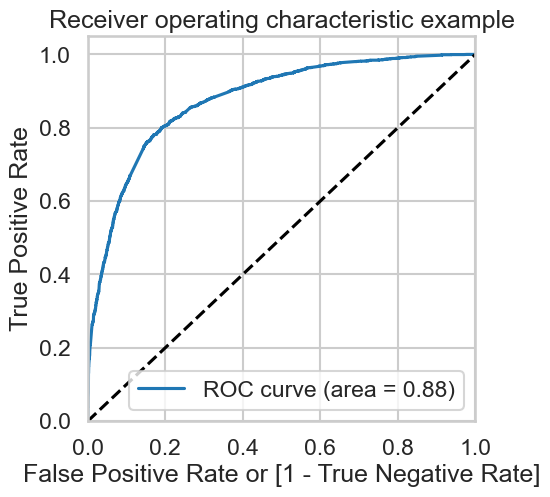

In [137]:

# Call the ROC function

draw_roc(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

The area under the curve of the ROC is 0.88 which is quite good. So we seem to have a good model. Let's also check the sensitivity and specificity tradeoff to find the optimal cutoff point

In [138]:
# Let's create columns with different probability cutoffs 

numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.934275,1,1,1,1,1,1,1,1,1,1,1
1,1,0.579321,1,1,1,1,1,1,1,0,0,0,0
2,0,0.269309,0,1,1,1,0,0,0,0,0,0,0
3,0,0.255037,0,1,1,1,0,0,0,0,0,0,0
4,0,0.671979,1,1,1,1,1,1,1,1,0,0,0


In [139]:
# Let's create a dataframe to see the values of accuracy, sensitivity, and specificity at different values of probabiity cutoffs

cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.374403  1.000000  0.000000
0.1   0.1  0.597262  0.972789  0.372519
0.2   0.2  0.712034  0.914116  0.591094
0.3   0.3  0.792741  0.826105  0.772774
0.4   0.4  0.811684  0.774235  0.834097
0.5   0.5  0.805317  0.646259  0.900509
0.6   0.6  0.795288  0.579082  0.924682
0.7   0.7  0.773798  0.485969  0.946056
0.8   0.8  0.749443  0.384779  0.967684
0.9   0.9  0.716969  0.261905  0.989313


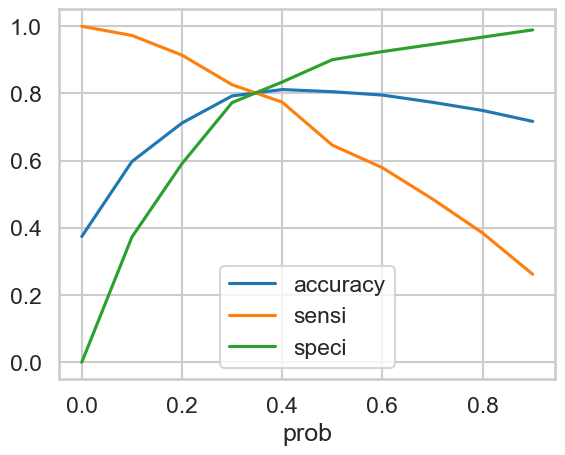

In [140]:
# Let's plot it as well

cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

As you can see that around 0.35, you get the optimal values of the three metrics. So let's choose 0.35 as our cutoff now.



In [141]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conversion_Prob.map( lambda x: 1 if x > 0.35 else 0)

y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1,0.934275,1,1,1,1,1,1,1,1,1,1,1,1
1,1,0.579321,1,1,1,1,1,1,1,0,0,0,0,1
2,0,0.269309,0,1,1,1,0,0,0,0,0,0,0,0
3,0,0.255037,0,1,1,1,0,0,0,0,0,0,0,0
4,0,0.671979,1,1,1,1,1,1,1,1,0,0,0,1


In [142]:
# Let's check the accuracy now

metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8059535179879019

In [143]:
# Let's create the confusion matrix once again

confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3184,  746],
       [ 473, 1879]])

In [144]:
# Let's evaluate the other metrics as well

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [145]:
# Calculate Sensitivity

TP/(TP+FN)

0.7988945578231292

In [146]:
# Calculate Specificity

TN/(TN+FP)

0.8101781170483461

This Cut off seems good to go

In [147]:
#finding the weights
round(res.params,4)

const                                                  -1.1136
Do Not Email                                           -0.7603
Total Time Spent on Website                             4.7311
Lead Origin_Landing Page Submission                    -0.3260
Lead Origin_Lead Add Form                               4.8161
Lead Source_Olark Chat                                  0.9797
Lead Source_Reference                                  -1.4199
Last Activity_Email Bounced                            -1.8227
Last Activity_Olark Chat Conversation                  -1.3557
Last Activity_Page Visited on Website                  -0.8051
What is your current occupation_Unknown                -1.0867
What is your current occupation_Working Professional    2.5207
Last Notable Activity_Modified                         -0.8259
Page_view_bin1_1-2                                     -0.3970
dtype: float64

Key Variables are:
- Total Time Spent on Website 
- Lead Origin_Lead Add Form 
- What is your current occupation_Working Professional

## Predicting on Test Data Set

In [148]:
# Scale the test set as well using just 'transform'

X_test[num_vars] = scaler.transform(X_test[num_vars])

In [149]:
# Select the columns in X_train for X_test as well

X_test = X_test[col]
X_test.head()

,Lead Number,Do Not Email,Total Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Olark Chat,Lead Source_Reference,Last Activity_Email Bounced,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_SMS Sent,What is your current occupation_Unknown,What is your current occupation_Working Professional,A free copy of Mastering The Interview_1,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Page_view_bin1_1-2,Total_time_spent_on_Website_bin1_300++
1340,645785,0,0.083187,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
9123,580429,0,0.127641,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0
4966,612298,0,0.114877,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
5906,604600,0,0.325264,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1
1299,646253,0,0.000000,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0


In [150]:
# Add a constant to X_test

X_test_sm = sm.add_constant(X_test[col])

In [151]:
# Check X_test_sm

X_test_sm

,const,Lead Number,Do Not Email,Total Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Source_Olark Chat,Lead Source_Reference,Last Activity_Email Bounced,Last Activity_Email Opened,Last Activity_Olark Chat Conversation,Last Activity_Page Visited on Website,Last Activity_SMS Sent,What is your current occupation_Unknown,What is your current occupation_Working Professional,A free copy of Mastering The Interview_1,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_SMS Sent,Page_view_bin1_1-2,Total_time_spent_on_Website_bin1_300++
1340,1.0,645785,0,0.083187,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
9123,1.0,580429,0,0.127641,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0
4966,1.0,612298,0,0.114877,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0
5906,1.0,604600,0,0.325264,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1
1299,1.0,646253,0,0.000000,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
6238,1.0,601912,0,0.000000,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
1314,1.0,646068,0,0.694982,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,1,1
5618,1.0,606886,0,0.001320,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
2625,1.0,634306,0,0.131602,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0
418,1.0,655949,0,0.043134,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


In [152]:
# Drop the required columns from X_test as well

X_test.drop(['Lead Number', 'Last Notable Activity_Email Opened', \
                  'Last Activity_Email Opened' , 'Last Notable Activity_SMS Sent',\
                 'Last Activity_SMS Sent', 'A free copy of Mastering The Interview_1', \
            'Total_time_spent_on_Website_bin1_300++'], 1, inplace = True)


/var/folders/vz/fgr1b6dj3xz970h32gw7wgcdgxsz05/T/ipykernel_29318/492422163.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X_test.drop(['Lead Number', 'Last Notable Activity_Email Opened', \


In [153]:
# Make predictions on the test set and store it in the variable 'y_test_pred'

y_test_pred = res.predict(sm.add_constant(X_test))

In [154]:
y_test_pred[:10]

1340    0.191080
9123    0.225710
4966    0.289853
5906    0.245336
1299    0.907423
6238    0.907423
1314    0.981516
5618    0.138200
2625    0.115080
418     0.112902
dtype: float64

In [155]:
# Converting y_pred to a dataframe

y_pred_1 = pd.DataFrame(y_test_pred)

In [156]:
# Let's see the head

y_pred_1.head()

,0
1340,0.191080
9123,0.225710
4966,0.289853
5906,0.245336
1299,0.907423


In [157]:
# Converting y_test to dataframe

y_test_df = pd.DataFrame(y_test)

In [158]:
# Remove index for both dataframes to append them side by side 

y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [159]:
# Append y_test_df and y_pred_1

y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [160]:
# Check 'y_pred_final'

y_pred_final.head()

,Converted,0
0,1,0.191080
1,0,0.225710
2,0,0.289853
3,0,0.245336
4,1,0.907423


In [161]:
# Rename the column 

y_pred_final= y_pred_final.rename(columns = {0 : 'Conversion_Prob'})

In [162]:
# Let's see the head of y_pred_final

y_pred_final.head()

,Converted,Conversion_Prob
0,1,0.191080
1,0,0.225710
2,0,0.289853
3,0,0.245336
4,1,0.907423


In [163]:
# Make predictions on the test set using 0.45 as the cutoff

y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.35 else 0)


In [164]:
# Check y_pred_final

y_pred_final.head()

,Converted,Conversion_Prob,final_predicted
0,1,0.191080,0
1,0,0.225710,0
2,0,0.289853,0
3,0,0.245336,0
4,1,0.907423,1


In [165]:
 # Let's check the overall accuracy

metrics.accuracy_score(y_pred_final['Converted'], y_pred_final.final_predicted)

0.8132194578536948

In [166]:
confusion2 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final.final_predicted )
confusion2

array([[1356,  292],
       [ 211,  834]])

In [167]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [168]:
# Calculate sensitivity
TP / float(TP+FN)

0.7980861244019138

In [169]:
# Calculate specificity
TN / float(TN+FP)

0.8228155339805825

### Precision-Recall View

Let's now also build the training model using the precision-recall view

In [170]:
#Looking at the confusion matrix again

confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.Predicted )
confusion

array([[3539,  391],
       [ 832, 1520]])

#### Precision
TP / TP + FP

In [171]:
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.7953950811093669

#### Recall
TP / TP + FN

In [172]:
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.6462585034013606

### Precision and recall tradeoff

In [173]:

from sklearn.metrics import precision_recall_curve
y_train_pred_final.Converted, y_train_pred_final.Predicted

(0       1
 1       1
 2       0
 3       0
 4       0
 5       0
 6       0
 7       0
 8       1
 9       0
 10      1
 11      0
 12      0
 13      1
 14      0
 15      1
 16      0
 17      0
 18      0
 19      0
 20      0
 21      1
 22      0
 23      0
 24      0
 25      0
 26      0
 27      0
 28      1
 29      1
 30      1
 31      0
 32      0
 33      0
 34      1
 35      0
 36      1
 37      0
 38      0
 39      1
 40      0
 41      0
 42      1
 43      0
 44      1
 45      0
 46      1
 47      1
 48      1
 49      1
 50      0
 51      0
 52      0
 53      0
 54      1
 55      0
 56      0
 57      1
 58      1
 59      0
 60      1
 61      0
 62      0
 63      1
 64      0
 65      1
 66      0
 67      0
 68      0
 69      1
 70      0
 71      1
 72      0
 73      0
 74      1
 75      1
 76      0
 77      0
 78      1
 79      1
 80      1
 81      1
 82      1
 83      1
 84      1
 85      1
 86      0
 87      0
 88      1
 89      1
 90      0

In [174]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Conversion_Prob)

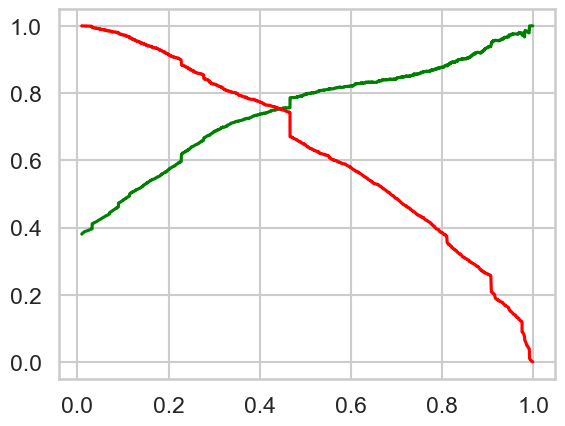

In [175]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

In [176]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.42 else 0)

y_train_pred_final.head()

,Converted,Conversion_Prob,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1,0.934275,1,1,1,1,1,1,1,1,1,1,1,1
1,1,0.579321,1,1,1,1,1,1,1,0,0,0,0,1
2,0,0.269309,0,1,1,1,0,0,0,0,0,0,0,0
3,0,0.255037,0,1,1,1,0,0,0,0,0,0,0,0
4,0,0.671979,1,1,1,1,1,1,1,1,0,0,0,1


In [177]:
# Let's check the accuracy now

metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.8132760267430754

In [178]:
# Let's create the confusion matrix once again

confusion2 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion2

array([[3312,  618],
       [ 555, 1797]])

In [179]:
# Let's evaluate the other metrics as well

TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [180]:
# Calculate Precision

TP/(TP+FP)

0.7440993788819876

In [181]:
# Calculate Recall

TP/(TP+FN)

0.764030612244898

This cutoff point seems good to go!

In [183]:
#Checking the weights
round(res.params, 4)

const                                                  -1.1136
Do Not Email                                           -0.7603
Total Time Spent on Website                             4.7311
Lead Origin_Landing Page Submission                    -0.3260
Lead Origin_Lead Add Form                               4.8161
Lead Source_Olark Chat                                  0.9797
Lead Source_Reference                                  -1.4199
Last Activity_Email Bounced                            -1.8227
Last Activity_Olark Chat Conversation                  -1.3557
Last Activity_Page Visited on Website                  -0.8051
What is your current occupation_Unknown                -1.0867
What is your current occupation_Working Professional    2.5207
Last Notable Activity_Modified                         -0.8259
Page_view_bin1_1-2                                     -0.3970
dtype: float64

Lead Origin_Lead Add Form, Lead Source_Reference, and What is your current occupation_Working Professional make some of the key variables

## Making Predictions on the Test Set

In [184]:
# Make predictions on the test set and store it in the variable 'y_test_pred'

y_test_pred = res.predict(sm.add_constant(X_test))

In [185]:
y_test_pred[:10]

1340    0.191080
9123    0.225710
4966    0.289853
5906    0.245336
1299    0.907423
6238    0.907423
1314    0.981516
5618    0.138200
2625    0.115080
418     0.112902
dtype: float64

In [186]:
# Converting y_pred to a dataframe

y_pred_1 = pd.DataFrame(y_test_pred)

In [187]:
# Let's see the head

y_pred_1.head()

,0
1340,0.191080
9123,0.225710
4966,0.289853
5906,0.245336
1299,0.907423


In [188]:
# Converting y_test to dataframe

y_test_df = pd.DataFrame(y_test)

In [189]:
# Remove index for both dataframes to append them side by side 

y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [190]:
# Append y_test_df and y_pred_1

y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [191]:
# Check 'y_pred_final'

y_pred_final.head()

,Converted,0
0,1,0.191080
1,0,0.225710
2,0,0.289853
3,0,0.245336
4,1,0.907423


In [192]:
# Rename the column 

y_pred_final= y_pred_final.rename(columns = {0 : 'Conversion_Prob'})

In [193]:
# Make predictions on the test set using 0.44 as the cutoff

y_pred_final['final_predicted'] = y_pred_final.Conversion_Prob.map(lambda x: 1 if x > 0.42 else 0)

In [194]:
# Check y_pred_final

y_pred_final.head()

,Converted,Conversion_Prob,final_predicted
0,1,0.191080,0
1,0,0.225710,0
2,0,0.289853,0
3,0,0.245336,0
4,1,0.907423,1


In [195]:
# Let's check the overall accuracy

metrics.accuracy_score(y_pred_final['Converted'], y_pred_final.final_predicted)

0.8147047901968065

In [196]:
confusion2 = metrics.confusion_matrix(y_pred_final['Converted'], y_pred_final.final_predicted )
confusion2

array([[1397,  251],
       [ 248,  797]])

In [197]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [198]:
# Calculate Precision

TP/(TP+FP)

0.7604961832061069

In [199]:
# Calculate Recall

TP/(TP+FN)

0.7626794258373206

# Summary
There are a lot of leads generated in the initial stage (top) but only a few of them come out as paying customers from the bottom. In the middle stage, you need to nurture the potential leads well (i.e. educating the leads about the product, constantly communicating etc.) in order to get a higher lead conversion. 
- sort out the best prospects from the leads you have generated. 'TotalVisits' , 'Total Time Spent on Website' , 'Page Views Per Visit' which contribute most towards the probability of a lead getting converted 
- You must keep a list of leads handy so that you can inform them about new courses, services, job offers and future higher studies 
- Monitor each lead carefully so that you can tailor the information you send to them 
- Carefully provide job offerings, information or courses that suits best according to the interest of the leads. 
- A proper plan to chart the needs of each lead will go a long way to capture the leads as prospects. 
- Focus on converted leads. 
- Hold question-answer sessions with leads to extract the right information you need about them. 
- Make further inquiries and appointments with the leads to determine their intention and mentality to join online courses